#  Interconnect  Churn  Rate  Modeling

This  project  uses  ML  algorithms  and  models  to  target  customers  who  may  be  interested  in  leaving  Interconnect  with  promotional  material  to  ensure  brand  loyalty  and  lower  the  churn  rate  for  the  business.  The  primary  metric  for  this  project  is  AUC-ROC  and  additional  metric  is  accuracy.  

##  Initialization

In [5]:
%matplotlib inline

import time
import pandas as pd
import seaborn as sns
import math
import matplotlib.pyplot as plt
import sklearn.metrics
import numpy as np
from scipy import stats as st
import datetime

from sklearn.linear_model import LinearRegression
import sklearn.preprocessing

from sklearn.model_selection import train_test_split

from IPython.display import display

from sklearn.metrics import accuracy_score, roc_auc_score, f1_score, confusion_matrix
from sklearn.model_selection import GridSearchCV, train_test_split, cross_val_score
from sklearn.ensemble import RandomForestClassifier, ExtraTreesClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.preprocessing import OrdinalEncoder, StandardScaler

import sklearn.preprocessing

import warnings
warnings.filterwarnings('ignore')
import plotly.express as px
from imblearn.over_sampling import SMOTE

##  Preprocessing

In [8]:
try:
    contract_df = pd.read_csv('/Users/ericmacdougall/Downloads/final_provider/contract.csv')
    internet_df = pd.read_csv('/Users/ericmacdougall/Downloads/final_provider/internet.csv')
    personal_df = pd.read_csv('/Users/ericmacdougall/Downloads/final_provider/personal.csv')
    phone_df = pd.read_csv('/Users/ericmacdougall/Downloads/final_provider/phone.csv')
except:
    print("Files failed to be loaded locally. Will try to load these files through Tripleten platform.")
    contract_df = pd.read_csv('/datasets/final_provider/contract.csv')
    internet_df = pd.read_csv('/datasets/final_provider/internet.csv')
    personal_df = pd.read_csv('/datasets/final_provider/personal.csv')
    phone_df = pd.read_csv('/datasets/final_provider/phone.csv')

In [10]:
contract_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7043 entries, 0 to 7042
Data columns (total 8 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   customerID        7043 non-null   object 
 1   BeginDate         7043 non-null   object 
 2   EndDate           7043 non-null   object 
 3   Type              7043 non-null   object 
 4   PaperlessBilling  7043 non-null   object 
 5   PaymentMethod     7043 non-null   object 
 6   MonthlyCharges    7043 non-null   float64
 7   TotalCharges      7043 non-null   object 
dtypes: float64(1), object(7)
memory usage: 440.3+ KB


In [12]:
internet_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5517 entries, 0 to 5516
Data columns (total 8 columns):
 #   Column            Non-Null Count  Dtype 
---  ------            --------------  ----- 
 0   customerID        5517 non-null   object
 1   InternetService   5517 non-null   object
 2   OnlineSecurity    5517 non-null   object
 3   OnlineBackup      5517 non-null   object
 4   DeviceProtection  5517 non-null   object
 5   TechSupport       5517 non-null   object
 6   StreamingTV       5517 non-null   object
 7   StreamingMovies   5517 non-null   object
dtypes: object(8)
memory usage: 344.9+ KB


In [14]:
personal_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7043 entries, 0 to 7042
Data columns (total 5 columns):
 #   Column         Non-Null Count  Dtype 
---  ------         --------------  ----- 
 0   customerID     7043 non-null   object
 1   gender         7043 non-null   object
 2   SeniorCitizen  7043 non-null   int64 
 3   Partner        7043 non-null   object
 4   Dependents     7043 non-null   object
dtypes: int64(1), object(4)
memory usage: 275.2+ KB


In [16]:
phone_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6361 entries, 0 to 6360
Data columns (total 2 columns):
 #   Column         Non-Null Count  Dtype 
---  ------         --------------  ----- 
 0   customerID     6361 non-null   object
 1   MultipleLines  6361 non-null   object
dtypes: object(2)
memory usage: 99.5+ KB


I  call  .info()  on  all  the  datasets  to  get  preliminary  information.  Now  I'm  going  to  check  for  duplicates.

In [19]:
contract_df.duplicated().sum()

0

In [21]:
internet_df.duplicated().sum()

0

In [23]:
personal_df.duplicated().sum()

0

In [25]:
phone_df.duplicated().sum()

0

There  are  no  duplicates  in  any  of  the  datasets.  I  will  check  if  this  remains  true  after  merging  all  the  datasets.

In [28]:
inter_df = contract_df.merge(personal_df, how='outer', on='customerID')

In [30]:
inter_df= inter_df.merge(internet_df, how='outer', on='customerID')

In [32]:
full_df = inter_df.merge(phone_df, how='outer', on='customerID')
full_df = full_df.copy()

In [34]:
full_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7043 entries, 0 to 7042
Data columns (total 20 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   customerID        7043 non-null   object 
 1   BeginDate         7043 non-null   object 
 2   EndDate           7043 non-null   object 
 3   Type              7043 non-null   object 
 4   PaperlessBilling  7043 non-null   object 
 5   PaymentMethod     7043 non-null   object 
 6   MonthlyCharges    7043 non-null   float64
 7   TotalCharges      7043 non-null   object 
 8   gender            7043 non-null   object 
 9   SeniorCitizen     7043 non-null   int64  
 10  Partner           7043 non-null   object 
 11  Dependents        7043 non-null   object 
 12  InternetService   5517 non-null   object 
 13  OnlineSecurity    5517 non-null   object 
 14  OnlineBackup      5517 non-null   object 
 15  DeviceProtection  5517 non-null   object 
 16  TechSupport       5517 non-null   object 


In [36]:
full_df.duplicated().sum()

0

There  are  no  duplicates  in  the  full  dataset.

In [39]:
full_df = full_df.fillna('unknown')

Nulls  should  be  simply  filled  with  'unknown'  and  then  encoded  to  have  minimal  effect  on  modeling.  Lack  of  numerical  data  makes  pairplots,  correlations,  and  plotting  in  general  rather  useless  at  this  point  of  analysis.  That  will  change  after  encoding.

In [42]:
churn_rate = len(full_df[full_df['EndDate']!='No']) / len(full_df)
churn_rate

0.2653698707936959

The  churn  rate  for  this  data  is  26.54%.  The  entry  'No'  represents  an  active  user  for  the  telecom  so  any  other  data  in  that  field  means  the  user  has  already  left  the  platform.  We  will  need  to  significantly  balance  the  target  field  and  the  rest  of  the  dataframe.

In [45]:
full_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7043 entries, 0 to 7042
Data columns (total 20 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   customerID        7043 non-null   object 
 1   BeginDate         7043 non-null   object 
 2   EndDate           7043 non-null   object 
 3   Type              7043 non-null   object 
 4   PaperlessBilling  7043 non-null   object 
 5   PaymentMethod     7043 non-null   object 
 6   MonthlyCharges    7043 non-null   float64
 7   TotalCharges      7043 non-null   object 
 8   gender            7043 non-null   object 
 9   SeniorCitizen     7043 non-null   int64  
 10  Partner           7043 non-null   object 
 11  Dependents        7043 non-null   object 
 12  InternetService   7043 non-null   object 
 13  OnlineSecurity    7043 non-null   object 
 14  OnlineBackup      7043 non-null   object 
 15  DeviceProtection  7043 non-null   object 
 16  TechSupport       7043 non-null   object 


There  are  no  null  values  viewable  through  this  method  now.  'TotalCharges'  however  is  incorrectly  typed  and  that  must  be  addressed  before  encoding.  But  I  begin  by  getting  an  overview  of  the  data  and  making  the  dataframe  more  legible  and  easier  to  work  with.

In [48]:
full_df.describe()

,MonthlyCharges,SeniorCitizen
count,7043.000000,7043.000000
mean,64.761692,0.162147
std,30.090047,0.368612
min,18.250000,0.000000
25%,35.500000,0.000000
50%,70.350000,0.000000
75%,89.850000,0.000000
max,118.750000,1.000000


In [50]:
full_df = full_df.rename(str.lower,  axis='columns')

I  make  the  dataframe's  columns  lowercase.

In [53]:
full_df.columns

Index(['customerid', 'begindate', 'enddate', 'type', 'paperlessbilling',
       'paymentmethod', 'monthlycharges', 'totalcharges', 'gender',
       'seniorcitizen', 'partner', 'dependents', 'internetservice',
       'onlinesecurity', 'onlinebackup', 'deviceprotection', 'techsupport',
       'streamingtv', 'streamingmovies', 'multiplelines'],
      dtype='object')

In [55]:
full_df = full_df.rename(columns={'customerid': 'customer_id', 
                                  'begindate': 'begin_date', 
                                  'enddate': 'end_date', 
                                  'paperlessbilling': 'paperless_billing', 
                                  'paymentmethod': 'payment_method', 
                                  'monthlycharges': 'monthly_charges', 
                                  'totalcharges': 'total_charges',
                                  'seniorcitizen': 'senior_citizen',
                                  'internetservice': 'internet_service',
                                  'onlinesecurity': 'online_security', 
                                  'onlinebackup': 'online_backup', 
                                  'deviceprotection': 'device_protection', 
                                  'techsupport': 'tech_support',
                                  'streamingtv': 'streaming_tv', 
                                  'streamingmovies': 'streaming_movies', 
                                  'multiplelines': 'multiple_lines'})

In [57]:
full_df.head(5)

,customer_id,begin_date,end_date,type,paperless_billing,payment_method,monthly_charges,total_charges,gender,senior_citizen,partner,dependents,internet_service,online_security,online_backup,device_protection,tech_support,streaming_tv,streaming_movies,multiple_lines
0,0002-ORFBO,2019-05-01,No,One year,Yes,Mailed check,65.6,593.3,Female,0,Yes,Yes,DSL,No,Yes,No,Yes,Yes,No,No
1,0003-MKNFE,2019-05-01,No,Month-to-month,No,Mailed check,59.9,542.4,Male,0,No,No,DSL,No,No,No,No,No,Yes,Yes
2,0004-TLHLJ,2019-09-01,2020-01-01 00:00:00,Month-to-month,Yes,Electronic check,73.9,280.85,Male,0,No,No,Fiber optic,No,No,Yes,No,No,No,No
3,0011-IGKFF,2018-12-01,2020-01-01 00:00:00,Month-to-month,Yes,Electronic check,98.0,1237.85,Male,1,Yes,No,Fiber optic,No,Yes,Yes,No,Yes,Yes,No
4,0013-EXCHZ,2019-09-01,2019-12-01 00:00:00,Month-to-month,Yes,Mailed check,83.9,267.4,Female,1,Yes,No,Fiber optic,No,No,No,Yes,Yes,No,No


In [59]:
full_df.sample(10)

,customer_id,begin_date,end_date,type,paperless_billing,payment_method,monthly_charges,total_charges,gender,senior_citizen,partner,dependents,internet_service,online_security,online_backup,device_protection,tech_support,streaming_tv,streaming_movies,multiple_lines
848,1228-ZLNBX,2018-05-01,No,Month-to-month,No,Mailed check,75.30,1570.7,Male,0,No,No,Fiber optic,No,No,No,No,No,No,Yes
3793,5334-JLAXU,2015-02-01,No,Month-to-month,Yes,Credit card (automatic),94.10,5475.9,Female,0,Yes,No,Fiber optic,Yes,Yes,No,No,No,Yes,Yes
5967,8406-LNMHF,2015-03-01,No,One year,Yes,Credit card (automatic),82.95,4903.15,Male,1,Yes,No,Fiber optic,Yes,Yes,Yes,No,No,No,No
946,1371-OJCEK,2016-02-01,No,One year,No,Bank transfer (automatic),24.35,1133.7,Female,0,No,No,unknown,unknown,unknown,unknown,unknown,unknown,unknown,Yes
151,0253-ZTEOB,2016-02-01,No,Two year,No,Electronic check,79.65,3870.3,Female,0,Yes,Yes,DSL,No,Yes,No,Yes,Yes,Yes,Yes
2064,2969-WGHQO,2019-07-01,No,One year,No,Electronic check,69.45,477.05,Female,0,Yes,Yes,DSL,Yes,Yes,Yes,No,Yes,No,No
2959,4227-OJHAL,2014-06-01,No,One year,Yes,Credit card (automatic),73.00,5163,Female,0,Yes,Yes,DSL,Yes,Yes,Yes,No,Yes,No,Yes
4472,6305-YLBMM,2014-01-01,2019-10-01 00:00:00,One year,Yes,Bank transfer (automatic),104.05,7262,Male,0,No,No,Fiber optic,No,Yes,Yes,Yes,Yes,Yes,No
1184,1741-WTPON,2015-06-01,No,Two year,No,Mailed check,115.85,6567.9,Male,0,Yes,Yes,Fiber optic,Yes,Yes,Yes,Yes,Yes,Yes,Yes
2831,4023-RTIQM,2017-07-01,No,One year,Yes,Credit card (automatic),50.40,1580.1,Female,1,Yes,No,DSL,Yes,Yes,Yes,No,No,Yes,unknown


In [61]:
full_df['total_charges'] = full_df['total_charges'].str.strip() # Remove any leading/trailing whitespace

full_df['total_charges'] = full_df['total_charges'].replace('', np.nan) # Replace any empty strings with np.nan
full_df.info() # Check for the change in the field

full_df = full_df.dropna().reset_index(drop=True) # I drop the 11 records that have a nan value in 'total_charges'

converted_charges = pd.to_numeric(full_df['total_charges'], errors='coerce').astype(np.float32)  
# I convert full_df['total_charges'] to float32 for a comparison below

# Check if a conversion would work
np.array_equal(full_df['total_charges'].astype(np.float32), converted_charges)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7043 entries, 0 to 7042
Data columns (total 20 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   customer_id        7043 non-null   object 
 1   begin_date         7043 non-null   object 
 2   end_date           7043 non-null   object 
 3   type               7043 non-null   object 
 4   paperless_billing  7043 non-null   object 
 5   payment_method     7043 non-null   object 
 6   monthly_charges    7043 non-null   float64
 7   total_charges      7032 non-null   object 
 8   gender             7043 non-null   object 
 9   senior_citizen     7043 non-null   int64  
 10  partner            7043 non-null   object 
 11  dependents         7043 non-null   object 
 12  internet_service   7043 non-null   object 
 13  online_security    7043 non-null   object 
 14  online_backup      7043 non-null   object 
 15  device_protection  7043 non-null   object 
 16  tech_support       7043 

True

In [63]:
full_df['total_charges'] = full_df['total_charges'].astype(np.float32) # I convert the field to float32 after the above cell said I could.

full_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7032 entries, 0 to 7031
Data columns (total 20 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   customer_id        7032 non-null   object 
 1   begin_date         7032 non-null   object 
 2   end_date           7032 non-null   object 
 3   type               7032 non-null   object 
 4   paperless_billing  7032 non-null   object 
 5   payment_method     7032 non-null   object 
 6   monthly_charges    7032 non-null   float64
 7   total_charges      7032 non-null   float32
 8   gender             7032 non-null   object 
 9   senior_citizen     7032 non-null   int64  
 10  partner            7032 non-null   object 
 11  dependents         7032 non-null   object 
 12  internet_service   7032 non-null   object 
 13  online_security    7032 non-null   object 
 14  online_backup      7032 non-null   object 
 15  device_protection  7032 non-null   object 
 16  tech_support       7032 

I  convert  the  'total_charges'  field  to  the  lowest  workable  float  datatype  and  confirm  the  conversion  and  dropping  the  few  records  with  nulls  in  that  field.

In [66]:
for i in full_df.columns:
    display(full_df[i].value_counts(normalize=True).head(5))

customer_id
0002-ORFBO    0.000142
6619-RPLQZ    0.000142
6629-LADHQ    0.000142
6629-CZTTH    0.000142
6627-CFOSN    0.000142
Name: proportion, dtype: float64

begin_date
2014-02-01    0.052048
2019-09-01    0.033703
2019-11-01    0.033703
2019-10-01    0.033703
2020-01-01    0.033134
Name: proportion, dtype: float64

end_date
No                     0.734215
2019-11-01 00:00:00    0.068970
2019-12-01 00:00:00    0.066268
2020-01-01 00:00:00    0.065415
2019-10-01 00:00:00    0.065131
Name: proportion, dtype: float64

type
Month-to-month    0.551052
Two year          0.239619
One year          0.209329
Name: proportion, dtype: float64

paperless_billing
Yes    0.592719
No     0.407281
Name: proportion, dtype: float64

payment_method
Electronic check             0.336320
Mailed check                 0.228100
Bank transfer (automatic)    0.219283
Credit card (automatic)      0.216297
Name: proportion, dtype: float64

monthly_charges
20.05    0.008675
19.85    0.006257
19.95    0.006257
19.90    0.006257
19.65    0.006115
Name: proportion, dtype: float64

total_charges
20.200001    0.001564
19.750000    0.001280
19.900000    0.001138
19.650000    0.001138
20.049999    0.001138
Name: proportion, dtype: float64

gender
Male      0.504693
Female    0.495307
Name: proportion, dtype: float64

senior_citizen
0    0.8376
1    0.1624
Name: proportion, dtype: float64

partner
No     0.517491
Yes    0.482509
Name: proportion, dtype: float64

dependents
No     0.701507
Yes    0.298493
Name: proportion, dtype: float64

internet_service
Fiber optic    0.440273
DSL            0.343572
unknown        0.216155
Name: proportion, dtype: float64

online_security
No         0.497298
Yes        0.286547
unknown    0.216155
Name: proportion, dtype: float64

online_backup
No         0.438993
Yes        0.344852
unknown    0.216155
Name: proportion, dtype: float64

device_protection
No         0.439989
Yes        0.343857
unknown    0.216155
Name: proportion, dtype: float64

tech_support
No         0.493743
Yes        0.290102
unknown    0.216155
Name: proportion, dtype: float64

streaming_tv
No         0.399460
Yes        0.384386
unknown    0.216155
Name: proportion, dtype: float64

streaming_movies
No         0.395478
Yes        0.388367
unknown    0.216155
Name: proportion, dtype: float64

multiple_lines
No         0.481371
Yes        0.421928
unknown    0.096701
Name: proportion, dtype: float64

The  field  'enddate'  represents  our  target  field  for  this  business  task.  Most  of  these  variables  can  be  encoded  to  binary  variables  and  then  scaled.  The  'begindate' field  should  be  converted  to  datetime  datatypes  and  I  can  add  features  by  parsing  the  dates  into  day,  month,  day  of  the  week,  and  year.

In [69]:
full_df['begin_date'].nunique()

76

In [71]:
np.array_equal(full_df['begin_date'], pd.to_datetime(full_df['begin_date'], format='%Y-%m-%d').astype(str))

True

In [73]:
full_df['begin_date'] = pd.to_datetime(full_df['begin_date'], format='%Y-%m-%d')

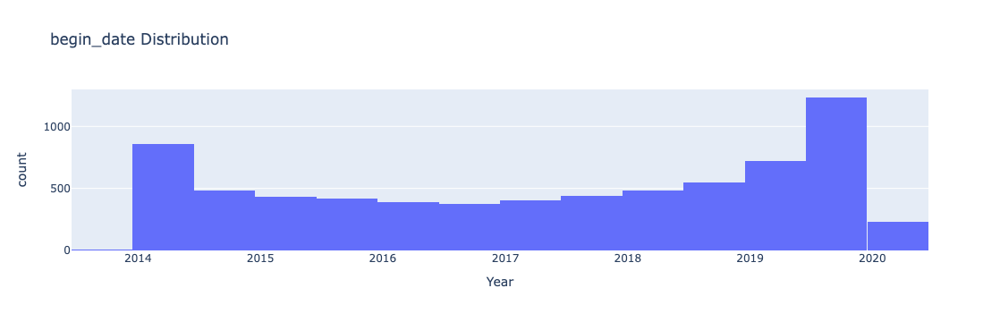

In [75]:
px.histogram(full_df, x='begin_date', nbins=20, title="begin_date Distribution", labels={'begin_date': 'Year'})

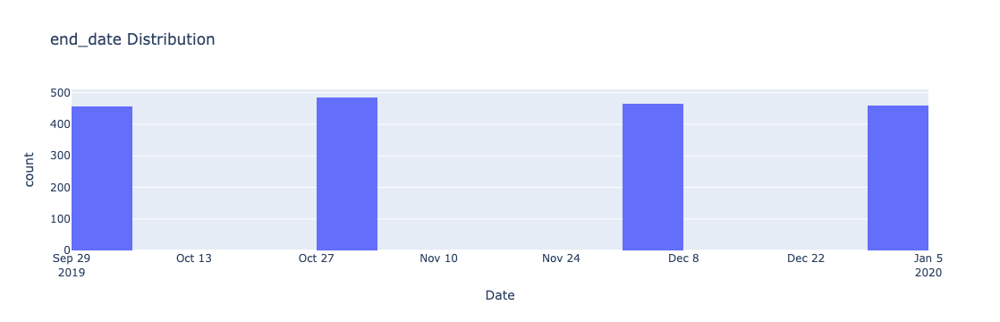

In [76]:
px.histogram((full_df.query('end_date != "No"')), x='end_date', nbins=20, title="end_date Distribution", labels={'end_date': 'Date'})

In [77]:
display(full_df['end_date'].unique())
full_df['end_date'].nunique()

array(['No', '2020-01-01 00:00:00', '2019-12-01 00:00:00',
       '2019-11-01 00:00:00', '2019-10-01 00:00:00'], dtype=object)

5

In [78]:
def make_features(data, data_column: str):

    data['begin_date_year'] = data[data_column].dt.year
    data['begin_date_month'] = data[data_column].dt.month
    data['begin_date_day'] = data[data_column].dt.day
    data['begin_date_dayofweek'] = data[data_column].dt.dayofweek

In [79]:
make_features(data=full_df, data_column='begin_date')
full_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7032 entries, 0 to 7031
Data columns (total 24 columns):
 #   Column                Non-Null Count  Dtype         
---  ------                --------------  -----         
 0   customer_id           7032 non-null   object        
 1   begin_date            7032 non-null   datetime64[ns]
 2   end_date              7032 non-null   object        
 3   type                  7032 non-null   object        
 4   paperless_billing     7032 non-null   object        
 5   payment_method        7032 non-null   object        
 6   monthly_charges       7032 non-null   float64       
 7   total_charges         7032 non-null   float32       
 8   gender                7032 non-null   object        
 9   senior_citizen        7032 non-null   int64         
 10  partner               7032 non-null   object        
 11  dependents            7032 non-null   object        
 12  internet_service      7032 non-null   object        
 13  online_security   

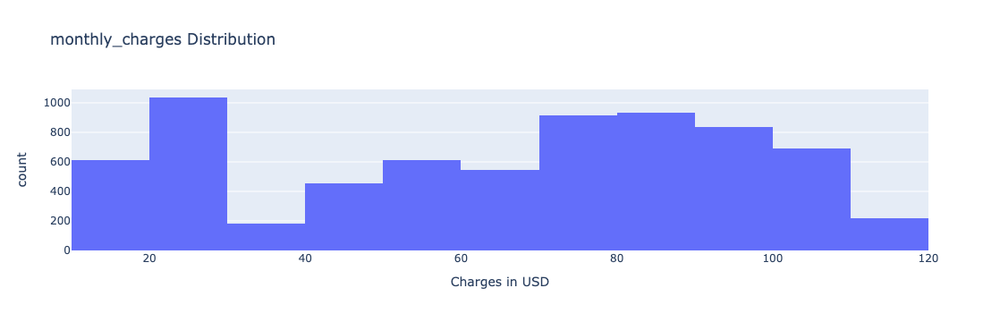

In [80]:
px.histogram(full_df, x='monthly_charges', nbins=20, title="monthly_charges Distribution", labels={'monthly_charges': 'Charges in USD'})

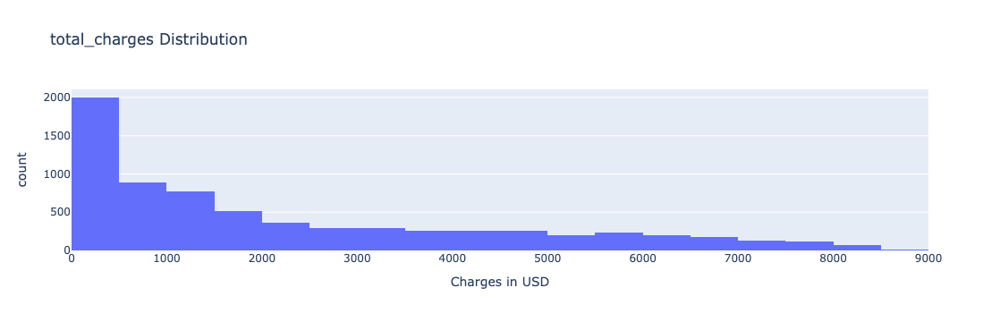

In [81]:
px.histogram(full_df, x='total_charges', nbins=20, title="total_charges Distribution", labels={'total_charges': 'Charges in USD'})

The value_counts() method above does an adequate job of portraying the breakdown of fields by each value. Most of the fields are not worth plotting since they'll need encoding. I created additional features with 'begin_date' but can't create additional features without 'end_date' which would cause data leakage. 

### Encodings

In [84]:
full_df.columns

Index(['customer_id', 'begin_date', 'end_date', 'type', 'paperless_billing',
       'payment_method', 'monthly_charges', 'total_charges', 'gender',
       'senior_citizen', 'partner', 'dependents', 'internet_service',
       'online_security', 'online_backup', 'device_protection', 'tech_support',
       'streaming_tv', 'streaming_movies', 'multiple_lines', 'begin_date_year',
       'begin_date_month', 'begin_date_day', 'begin_date_dayofweek'],
      dtype='object')

In [85]:
full_df['churn'] = np.where(full_df['end_date'] != 'No', 1, 0)

In [86]:
full_df['churn'].value_counts(normalize=True)

churn
0    0.734215
1    0.265785
Name: proportion, dtype: float64

In [87]:
categorical_features = full_df.columns.drop(['customer_id', 'begin_date', 'end_date', 'monthly_charges', 'total_charges', 'churn'])

In [94]:
df_ord = full_df.copy()
encoder = OrdinalEncoder()
df_ord[categorical_features] = encoder.fit_transform(full_df[categorical_features])
df_ord.head()

,customer_id,begin_date,end_date,type,paperless_billing,payment_method,monthly_charges,total_charges,gender,senior_citizen,...,device_protection,tech_support,streaming_tv,streaming_movies,multiple_lines,begin_date_year,begin_date_month,begin_date_day,begin_date_dayofweek,churn
0,0002-ORFBO,2019-05-01,No,1.0,1.0,3.0,65.6,593.299988,0.0,0.0,...,0.0,1.0,1.0,0.0,0.0,6.0,4.0,0.0,2.0,0
1,0003-MKNFE,2019-05-01,No,0.0,0.0,3.0,59.9,542.400024,1.0,0.0,...,0.0,0.0,0.0,1.0,1.0,6.0,4.0,0.0,2.0,0
2,0004-TLHLJ,2019-09-01,2020-01-01 00:00:00,0.0,1.0,2.0,73.9,280.850006,1.0,0.0,...,1.0,0.0,0.0,0.0,0.0,6.0,8.0,0.0,6.0,1
3,0011-IGKFF,2018-12-01,2020-01-01 00:00:00,0.0,1.0,2.0,98.0,1237.849976,1.0,1.0,...,1.0,0.0,1.0,1.0,0.0,5.0,11.0,0.0,5.0,1
4,0013-EXCHZ,2019-09-01,2019-12-01 00:00:00,0.0,1.0,3.0,83.9,267.399994,0.0,1.0,...,0.0,1.0,1.0,0.0,0.0,6.0,8.0,0.0,6.0,1


Ordinal  encoding  changes  binary  variables  into  0's  and  1's  and  encodes  the  other  categorical  variables.

In [101]:
df_ord.sample(10)

,customer_id,begin_date,end_date,type,paperless_billing,payment_method,monthly_charges,total_charges,gender,senior_citizen,...,device_protection,tech_support,streaming_tv,streaming_movies,multiple_lines,begin_date_year,begin_date_month,begin_date_day,begin_date_dayofweek,churn
3397,4828-FAZPK,2018-10-01,No,0.0,1.0,1.0,79.95,1267.949951,0.0,0.0,...,0.0,0.0,0.0,0.0,1.0,5.0,9.0,0.0,0.0,0
4742,6692-UDPJC,2018-11-01,2020-01-01 00:00:00,0.0,1.0,2.0,91.65,1301.000000,0.0,0.0,...,0.0,1.0,1.0,0.0,1.0,5.0,10.0,0.0,3.0,1
313,0463-WZZKO,2019-11-01,No,0.0,1.0,1.0,20.75,67.099998,1.0,0.0,...,2.0,2.0,2.0,2.0,0.0,6.0,10.0,0.0,4.0,0
365,0536-ACXIP,2014-02-01,No,2.0,1.0,2.0,109.55,8165.100098,0.0,0.0,...,1.0,0.0,1.0,1.0,1.0,1.0,1.0,0.0,5.0,0
160,0260-ZDLGK,2019-01-01,2019-10-01 00:00:00,0.0,1.0,3.0,72.90,651.400024,0.0,0.0,...,1.0,1.0,1.0,1.0,0.0,6.0,0.0,0.0,1.0,1
2542,3644-QXEHN,2019-01-01,No,0.0,0.0,2.0,97.00,1334.449951,1.0,0.0,...,1.0,0.0,1.0,1.0,0.0,6.0,0.0,0.0,1.0,0
5862,8259-NFJTV,2019-07-01,No,0.0,0.0,3.0,34.65,246.600006,0.0,0.0,...,0.0,1.0,0.0,0.0,2.0,6.0,6.0,0.0,0.0,0
4408,6229-UOLQL,2015-06-01,No,1.0,1.0,3.0,52.00,2884.899902,1.0,0.0,...,0.0,1.0,1.0,0.0,2.0,2.0,5.0,0.0,0.0,0
1723,2514-GINMM,2019-09-01,2019-10-01 00:00:00,0.0,1.0,2.0,79.50,79.500000,1.0,0.0,...,0.0,0.0,1.0,0.0,0.0,6.0,8.0,0.0,6.0,1
3889,5482-NUPNA,2019-06-01,2019-10-01 00:00:00,0.0,1.0,3.0,60.40,272.149994,0.0,0.0,...,0.0,1.0,0.0,0.0,0.0,6.0,5.0,0.0,5.0,1


In [102]:
df_ohe = pd.get_dummies(full_df, columns=categorical_features, drop_first=True, dtype=int)
print(df_ohe.shape)
df_ohe.sample(5)

(7032, 56)


,customer_id,begin_date,end_date,monthly_charges,total_charges,churn,type_One year,type_Two year,paperless_billing_Yes,payment_method_Credit card (automatic),...,begin_date_month_9,begin_date_month_10,begin_date_month_11,begin_date_month_12,begin_date_dayofweek_1,begin_date_dayofweek_2,begin_date_dayofweek_3,begin_date_dayofweek_4,begin_date_dayofweek_5,begin_date_dayofweek_6
5996,8480-PPONV,2014-12-01,No,115.55,7159.049805,0,0,1,0,0,...,0,0,0,1,0,0,0,0,0,0
5026,7079-QRCBC,2017-11-01,2019-11-01 00:00:00,98.75,2407.300049,1,0,0,1,0,...,0,0,1,0,0,1,0,0,0,0
3348,4786-UKSNZ,2019-12-01,2020-01-01 00:00:00,20.20,20.200001,1,0,0,0,0,...,0,0,0,1,0,0,0,0,0,1
2198,3158-MOERK,2019-09-01,2019-11-01 00:00:00,96.00,174.800003,1,0,0,1,0,...,1,0,0,0,0,0,0,0,0,1
4677,6614-YOLAC,2014-03-01,No,58.65,4145.250000,0,0,1,0,0,...,0,0,0,0,0,0,0,0,1,0


The high dimensionality of this dataframe is a weakness of One Hot Encoding and will likely make models created with this set perform less than df_ord. The high dimensionality mostly comes from feature engineering the date into separate fields.

### EDA

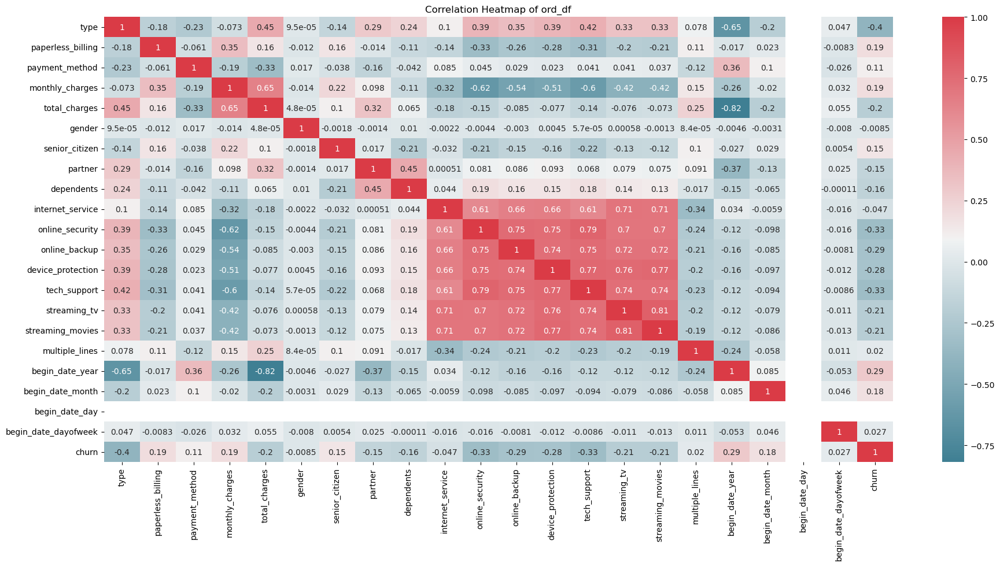

In [105]:
numerical_columns = df_ord.select_dtypes(include=[np.number])
corr = numerical_columns.corr()
plt.figure(figsize=(22, 10))
sns.heatmap(corr, cmap=sns.diverging_palette(220, 10, as_cmap=True), annot=True)
plt.title(label='Correlation Heatmap of ord_df')
plt.savefig("final_provider_heatmap.png")
plt.show()

The highest levels of correlation occur from fields merged from the internet_df and desctibes customers' use of online features/plans. 'Total_charges' and 'monthly_charges' also have a high correlation to each other, which is not surprising. There are no variables with a high correlation to our target field 'churn'.

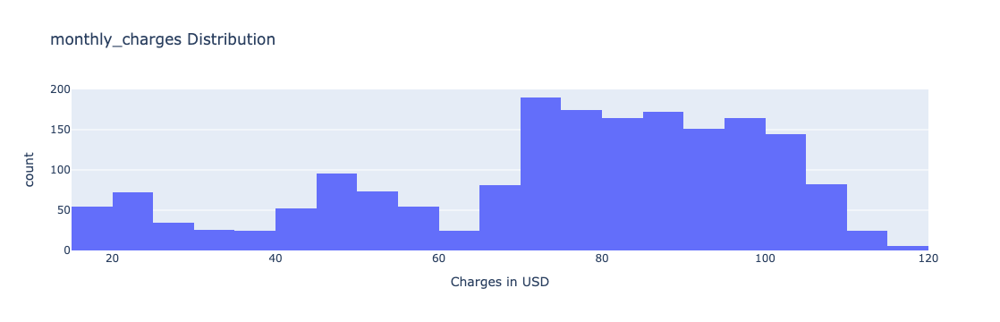

In [107]:
px.histogram(full_df.query('churn == 1'), x='monthly_charges', nbins=25, title="monthly_charges Distribution", labels={'monthly_charges': 'Charges in USD'})

In [109]:
print('Mean Monthly Charges in USD for those who left: ', full_df.query('churn == 1')['monthly_charges'].mean())
print('Median Monthly Charges in USD for those who left: ', full_df.query('churn == 1')['monthly_charges'].median())

Mean Monthly Charges in USD for those who left:  74.44133226324237
Median Monthly Charges in USD for those who left:  79.65


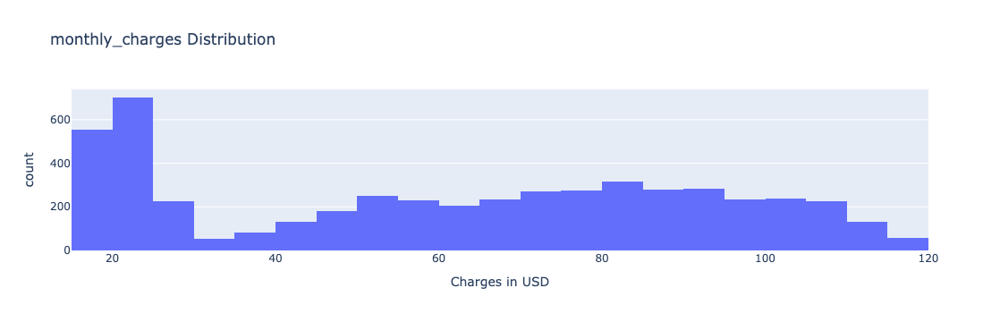

In [112]:
px.histogram(full_df.query('churn == 0'), x='monthly_charges', nbins=25, title="monthly_charges Distribution", labels={'monthly_charges': 'Charges in USD'})

In [113]:
print('Mean Monthly Charges in USD for those who stayed: ', full_df.query('churn == 0')['monthly_charges'].mean())
print('Median Monthly Charges in USD for those who stayed: ', full_df.query('churn == 0')['monthly_charges'].median())

Mean Monthly Charges in USD for those who stayed:  61.307408483439865
Median Monthly Charges in USD for those who stayed:  64.45


There are significant differences in the distributions of 'monthly_charges' between people who have left the service and who retain the service. The people who quit the service were paying more in monthly charges on average and the median payment was over $15 more than the people who retained the service.

In [115]:
for col in full_df.columns:
    display((full_df.query('churn == 1')[col].value_counts(normalize=True).head(5)))

customer_id
0004-TLHLJ    0.000535
6410-LEFEN    0.000535
6481-OGDOO    0.000535
6474-FVJLC    0.000535
6467-CHFZW    0.000535
Name: proportion, dtype: float64

begin_date
2019-09-01    0.089888
2019-10-01    0.077047
2019-11-01    0.070091
2019-12-01    0.056180
2019-07-01    0.040663
Name: proportion, dtype: float64

end_date
2019-11-01 00:00:00    0.259497
2019-12-01 00:00:00    0.249331
2020-01-01 00:00:00    0.246121
2019-10-01 00:00:00    0.245051
Name: proportion, dtype: float64

type
Month-to-month    0.885500
One year          0.088818
Two year          0.025682
Name: proportion, dtype: float64

paperless_billing
Yes    0.749064
No     0.250936
Name: proportion, dtype: float64

payment_method
Electronic check             0.573034
Mailed check                 0.164794
Bank transfer (automatic)    0.138042
Credit card (automatic)      0.124131
Name: proportion, dtype: float64

monthly_charges
74.40    0.006956
74.90    0.004815
45.30    0.004280
74.95    0.004280
70.15    0.003745
Name: proportion, dtype: float64

total_charges
20.200001    0.003210
45.299999    0.002675
75.300003    0.002140
19.900000    0.002140
69.599998    0.002140
Name: proportion, dtype: float64

gender
Female    0.502408
Male      0.497592
Name: proportion, dtype: float64

senior_citizen
0    0.745318
1    0.254682
Name: proportion, dtype: float64

partner
No     0.642055
Yes    0.357945
Name: proportion, dtype: float64

dependents
No     0.825575
Yes    0.174425
Name: proportion, dtype: float64

internet_service
Fiber optic    0.693954
DSL            0.245586
unknown        0.060460
Name: proportion, dtype: float64

online_security
No         0.781701
Yes        0.157838
unknown    0.060460
Name: proportion, dtype: float64

online_backup
No         0.659711
Yes        0.279829
unknown    0.060460
Name: proportion, dtype: float64

device_protection
No         0.64794
Yes        0.29160
unknown    0.06046
Name: proportion, dtype: float64

tech_support
No         0.773676
Yes        0.165864
unknown    0.060460
Name: proportion, dtype: float64

streaming_tv
No         0.504013
Yes        0.435527
unknown    0.060460
Name: proportion, dtype: float64

streaming_movies
No         0.501873
Yes        0.437667
unknown    0.060460
Name: proportion, dtype: float64

multiple_lines
Yes        0.454789
No         0.454254
unknown    0.090958
Name: proportion, dtype: float64

begin_date_year
2019    0.524880
2018    0.168539
2017    0.106474
2016    0.077582
2015    0.065811
Name: proportion, dtype: float64

begin_date_month
9     0.137507
11    0.119850
10    0.113430
12    0.109149
8     0.080792
Name: proportion, dtype: float64

begin_date_day
1    1.0
Name: proportion, dtype: float64

begin_date_dayofweek
6    0.211343
4    0.184591
1    0.147673
0    0.123060
5    0.119850
Name: proportion, dtype: float64

churn
1    1.0
Name: proportion, dtype: float64

Descriptive statistics for people who left: 89% had month-to-month subsciptions, 75% had paperless billing, 57% payed with electronic check, minimal difference in gender, 75% were not senior citizens, 64% had no partner, 83% had no dependents, and 69% had fiber optic internet service. Most of the digital services such as streaming were not used by most people.

In [117]:
for col in full_df.columns:
    display((full_df.query('churn == 0')[col].value_counts(normalize=True).head(5)))

customer_id
0002-ORFBO    0.000194
6726-WEXXK    0.000194
6691-CCIHA    0.000194
6689-VRRTK    0.000194
6685-XSHHU    0.000194
Name: proportion, dtype: float64

begin_date
2014-02-01    0.068952
2020-01-01    0.045129
2014-03-01    0.031764
2019-12-01    0.022274
2014-04-01    0.020918
Name: proportion, dtype: float64

end_date
No    1.0
Name: proportion, dtype: float64

type
Month-to-month    0.429983
Two year          0.317064
One year          0.252954
Name: proportion, dtype: float64

paperless_billing
Yes    0.536122
No     0.463878
Name: proportion, dtype: float64

payment_method
Mailed check                 0.251017
Electronic check             0.250629
Credit card (automatic)      0.249661
Bank transfer (automatic)    0.248693
Name: proportion, dtype: float64

monthly_charges
20.05    0.011234
19.95    0.007941
19.70    0.007747
19.90    0.007747
19.85    0.007554
Name: proportion, dtype: float64

total_charges
19.750000    0.001356
19.549999    0.001162
19.650000    0.001162
20.049999    0.001162
20.450001    0.000968
Name: proportion, dtype: float64

gender
Male      0.507263
Female    0.492737
Name: proportion, dtype: float64

senior_citizen
0    0.871005
1    0.128995
Name: proportion, dtype: float64

partner
Yes    0.5276
No     0.4724
Name: proportion, dtype: float64

dependents
No     0.656595
Yes    0.343405
Name: proportion, dtype: float64

internet_service
DSL            0.379043
Fiber optic    0.348441
unknown        0.272516
Name: proportion, dtype: float64

online_security
No         0.394344
Yes        0.333140
unknown    0.272516
Name: proportion, dtype: float64

online_backup
Yes        0.368390
No         0.359094
unknown    0.272516
Name: proportion, dtype: float64

device_protection
No         0.364710
Yes        0.362774
unknown    0.272516
Name: proportion, dtype: float64

tech_support
No         0.392408
Yes        0.335077
unknown    0.272516
Name: proportion, dtype: float64

streaming_tv
Yes        0.365873
No         0.361611
unknown    0.272516
Name: proportion, dtype: float64

streaming_movies
Yes        0.370521
No         0.356963
unknown    0.272516
Name: proportion, dtype: float64

multiple_lines
No         0.491187
Yes        0.410033
unknown    0.098780
Name: proportion, dtype: float64

begin_date_year
2014    0.241333
2019    0.189037
2015    0.141197
2018    0.138485
2017    0.125121
Name: proportion, dtype: float64

begin_date_month
2     0.129963
1     0.102460
3     0.093550
4     0.079992
12    0.077474
Name: proportion, dtype: float64

begin_date_day
1    1.0
Name: proportion, dtype: float64

begin_date_dayofweek
5    0.191749
2    0.151656
6    0.140229
4    0.140035
1    0.130157
Name: proportion, dtype: float64

churn
0    1.0
Name: proportion, dtype: float64

Descriptive statistics for people who stayed: 43% had month-to-month subsciptions, 25% mailed checks, 57% payed with electronic check, minimal difference in gender, 87% were not senior citizens, 53% had a partner, 66% had no dependents, and 38% had DSL internet service. Automatic credit card and bank transfers are the payment types that appeared least in the people who churned, but represent a pretty equal share in those who stayed. Having this cost be out-of-sight and out-of-mind likely encourages this service's retention and thus Interconnect would do well to encourage people using those payment methods.

The difference in monthly_charges could be a result of using different internet services as well as having different subscription types. 

In [120]:
full_df.groupby('type')['monthly_charges'].mean()

type
Month-to-month    66.398490
One year          65.079416
Two year          60.872374
Name: monthly_charges, dtype: float64

In [121]:
full_df.query('churn == 1').groupby('type')['monthly_charges'].mean()

type
Month-to-month    73.019396
One year          85.050904
Two year          86.777083
Name: monthly_charges, dtype: float64

In [122]:
full_df.query('churn == 0').groupby('type')['monthly_charges'].mean()

type
Month-to-month    61.462635
One year          62.540926
Two year          60.112798
Name: monthly_charges, dtype: float64

There does not seem to be any meaningful difference between the cost of the subscription type. Presumably, the cost differences has to be a result of using different services and infrastructure (e.g. DSL vs. Fiber-optic).

In [124]:
full_df.groupby('internet_service')['monthly_charges'].mean()

internet_service
DSL            58.088017
Fiber optic    91.500129
unknown        21.076283
Name: monthly_charges, dtype: float64

In [130]:
full_df.query('churn == 1').groupby('internet_service')['monthly_charges'].mean()

internet_service
DSL            49.083224
Fiber optic    88.126484
unknown        20.368142
Name: monthly_charges, dtype: float64

In [132]:
full_df.query('churn == 0').groupby('internet_service')['monthly_charges'].mean()

internet_service
DSL            60.200026
Fiber optic    93.932379
unknown        21.133156
Name: monthly_charges, dtype: float64

Looks like my assumption was confirmed and given that fiber-optic was used by 69% of the people who left, this likely accounts for the much higher monthly costs and probably the reason people choose a freer plan (though this may not be the only factor for the cost discrepancy). People are less likely to leave with a longer service plan, but there's no incentive for them to get a two-year plan if there's no cost benefit.

In [141]:
df_ord.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7032 entries, 0 to 7031
Data columns (total 25 columns):
 #   Column                Non-Null Count  Dtype         
---  ------                --------------  -----         
 0   customer_id           7032 non-null   object        
 1   begin_date            7032 non-null   datetime64[ns]
 2   end_date              7032 non-null   object        
 3   type                  7032 non-null   float64       
 4   paperless_billing     7032 non-null   float64       
 5   payment_method        7032 non-null   float64       
 6   monthly_charges       7032 non-null   float64       
 7   total_charges         7032 non-null   float32       
 8   gender                7032 non-null   float64       
 9   senior_citizen        7032 non-null   float64       
 10  partner               7032 non-null   float64       
 11  dependents            7032 non-null   float64       
 12  internet_service      7032 non-null   float64       
 13  online_security   

In [143]:
df_ohe.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7032 entries, 0 to 7031
Data columns (total 56 columns):
 #   Column                                  Non-Null Count  Dtype         
---  ------                                  --------------  -----         
 0   customer_id                             7032 non-null   object        
 1   begin_date                              7032 non-null   datetime64[ns]
 2   end_date                                7032 non-null   object        
 3   monthly_charges                         7032 non-null   float64       
 4   total_charges                           7032 non-null   float32       
 5   churn                                   7032 non-null   int64         
 6   type_One year                           7032 non-null   int64         
 7   type_Two year                           7032 non-null   int64         
 8   paperless_billing_Yes                   7032 non-null   int64         
 9   payment_method_Credit card (automatic)  7032 non-nul

The high dimensionality of this dataframe is a weakness of One Hot Encoding and will likely make models created with this set perform less than df_ord. The high dimensionality mostly comes from feature engineering the date into separate fields.

In [146]:
full_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7032 entries, 0 to 7031
Data columns (total 25 columns):
 #   Column                Non-Null Count  Dtype         
---  ------                --------------  -----         
 0   customer_id           7032 non-null   object        
 1   begin_date            7032 non-null   datetime64[ns]
 2   end_date              7032 non-null   object        
 3   type                  7032 non-null   object        
 4   paperless_billing     7032 non-null   object        
 5   payment_method        7032 non-null   object        
 6   monthly_charges       7032 non-null   float64       
 7   total_charges         7032 non-null   float32       
 8   gender                7032 non-null   object        
 9   senior_citizen        7032 non-null   int64         
 10  partner               7032 non-null   object        
 11  dependents            7032 non-null   object        
 12  internet_service      7032 non-null   object        
 13  online_security   

In [148]:
df_ord.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7032 entries, 0 to 7031
Data columns (total 25 columns):
 #   Column                Non-Null Count  Dtype         
---  ------                --------------  -----         
 0   customer_id           7032 non-null   object        
 1   begin_date            7032 non-null   datetime64[ns]
 2   end_date              7032 non-null   object        
 3   type                  7032 non-null   float64       
 4   paperless_billing     7032 non-null   float64       
 5   payment_method        7032 non-null   float64       
 6   monthly_charges       7032 non-null   float64       
 7   total_charges         7032 non-null   float32       
 8   gender                7032 non-null   float64       
 9   senior_citizen        7032 non-null   float64       
 10  partner               7032 non-null   float64       
 11  dependents            7032 non-null   float64       
 12  internet_service      7032 non-null   float64       
 13  online_security   

In [149]:
df_ohe.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7032 entries, 0 to 7031
Data columns (total 56 columns):
 #   Column                                  Non-Null Count  Dtype         
---  ------                                  --------------  -----         
 0   customer_id                             7032 non-null   object        
 1   begin_date                              7032 non-null   datetime64[ns]
 2   end_date                                7032 non-null   object        
 3   monthly_charges                         7032 non-null   float64       
 4   total_charges                           7032 non-null   float32       
 5   churn                                   7032 non-null   int64         
 6   type_One year                           7032 non-null   int64         
 7   type_Two year                           7032 non-null   int64         
 8   paperless_billing_Yes                   7032 non-null   int64         
 9   payment_method_Credit card (automatic)  7032 non-nul

In [152]:
df_ohe = df_ohe.drop(columns=['customer_id', 'end_date', 'begin_date'])
df_ord = df_ord.drop(columns=['customer_id', 'end_date', 'begin_date'])
full_df = full_df.drop(columns=['customer_id', 'end_date', 'begin_date'])

In [154]:
index_train_valid, index_test = train_test_split(full_df.index, test_size=0.2, random_state=42)

# Then split the train+val into train and validation
index_train, index_valid = train_test_split(index_train_valid, test_size=0.25, random_state=42)  # 0.25 x 0.8 = 0.2

# Step 3: Separate back into different encodings
train_ohe = df_ohe.loc[index_train]
val_ohe = df_ohe.loc[index_valid]
test_ohe = df_ohe.loc[index_test]

train_ord = df_ord.loc[index_train]
val_ord = df_ord.loc[index_valid]
test_ord = df_ord.loc[index_test]

train_df = full_df.loc[index_train]
val_df = full_df.loc[index_valid]
test_df = full_df.loc[index_test]

The above cell splits the full_df.index and passes those indices to the new variables so that each of the encodings have the same records for train, validation, and test sets. 

In [157]:
train_df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 4218 entries, 539 to 1738
Data columns (total 22 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   type                  4218 non-null   object 
 1   paperless_billing     4218 non-null   object 
 2   payment_method        4218 non-null   object 
 3   monthly_charges       4218 non-null   float64
 4   total_charges         4218 non-null   float32
 5   gender                4218 non-null   object 
 6   senior_citizen        4218 non-null   int64  
 7   partner               4218 non-null   object 
 8   dependents            4218 non-null   object 
 9   internet_service      4218 non-null   object 
 10  online_security       4218 non-null   object 
 11  online_backup         4218 non-null   object 
 12  device_protection     4218 non-null   object 
 13  tech_support          4218 non-null   object 
 14  streaming_tv          4218 non-null   object 
 15  streaming_movies      42

In [159]:
feature_columns = df_ohe.columns.drop('churn').tolist()
scaler = StandardScaler()

train_ohe.loc[:, feature_columns] = scaler.fit_transform(train_ohe.loc[:, feature_columns])
    
# Transform the validation and test sets
val_ohe.loc[:, feature_columns] = scaler.transform(val_ohe.loc[:, feature_columns])
test_ohe.loc[:, feature_columns] = scaler.transform(test_ohe.loc[:, feature_columns])

In [161]:
feature_columns = df_ord.columns.drop('churn').tolist()
scaler = StandardScaler()

train_ord.loc[:, feature_columns] = scaler.fit_transform(train_ord.loc[:, feature_columns])
    
# Transform the validation and test sets
val_ord.loc[:, feature_columns] = scaler.transform(val_ord.loc[:, feature_columns])
test_ord.loc[:, feature_columns] = scaler.transform(test_ord.loc[:, feature_columns])

##  Modeling
This  section  includes  every  method  and  model  that  I'll  be  using  in  the  'Testing'  section  to  reach  the  AUC-ROC  threshold  and  to  evaluate  model  performance. These methods include methods for sampling, modeling, recording metrics and charts to describe model performance. The code has been made as modular as possible while anticipating train, validation, and test sets in the parameters.

In [164]:
eval_stats_all = pd.DataFrame()

In [166]:
def model_to_string(model):
    # Method records the name and parameters of each model and returns it as a string.
    model_name = type(model).__name__  # Get the class name of the model
    params = model.get_params()  # Get the model parameters
    params_str = ', '.join(f'{k}={v}' for k, v in params.items())  # Create a formatted string of parameters
    return f"{model_name}({params_str})"

In [168]:
def record_metrics(model, df_eval_stats):
    # Method records the performance of each model on the test set in a global dataframe for easy reference and comparison in the
    # 'Conclusions' section. Returns an updated dataframe.
    global eval_stats_all

    metrics_row = {
        'model_name': type(model).__name__,
        'full_model': model_to_string(model),
        'test_accuracy': df_eval_stats['test'].get('Accuracy', None),
        'test_f1': df_eval_stats['test'].get('F1', None),
        'test_roc_auc': df_eval_stats['test'].get('ROC AUC', None),
        'test_aps': df_eval_stats['test'].get('APS', None)
    }
    
    metrics_df = pd.DataFrame([metrics_row])
    
    # Concatenate the new row to the existing DataFrame
    eval_stats_all = pd.concat([eval_stats_all, metrics_df], ignore_index=True)
            
    return eval_stats_all

In [170]:
import sklearn.metrics as metrics

def evaluate_model(model, train_features, train_target, test_features, test_target, val_features=None, val_target=None):
    # Method plots several graphs for a model's performance as well as prints out evaluation
    eval_stats = {}
    
    fig, axs = plt.subplots(1, 3, figsize=(20, 6)) 

    if (val_features is None or val_target is None):
        sets = (('train', train_features, train_target), ('test', test_features, test_target))
    else: 
        sets = (('train', train_features, train_target), ('val', val_features, val_target), ('test', test_features, test_target))
    
    for type, features, target in sets:
        
        eval_stats[type] = {}
    
        pred_target = model.predict(features)
        pred_proba = model.predict_proba(features)[:, 1]
        
        # F1
        f1_thresholds = np.arange(0, 1.01, 0.05)
        f1_scores = [metrics.f1_score(target, pred_proba>=threshold) for threshold in f1_thresholds]
        
        # ROC
        fpr, tpr, roc_thresholds = metrics.roc_curve(target, pred_proba)
        roc_auc = metrics.roc_auc_score(target, pred_proba)    
        eval_stats[type]['ROC AUC'] = roc_auc

        # PRC
        precision, recall, pr_thresholds = metrics.precision_recall_curve(target, pred_proba)
        aps = metrics.average_precision_score(target, pred_proba)
        eval_stats[type]['APS'] = aps
        
        if type == 'train':
            color = 'blue'
        elif type == 'val':
            color = 'pink'
        elif type == 'test':
            color = 'green'

        # F1 Score
        ax = axs[0]
        max_f1_score_idx = np.argmax(f1_scores)
        ax.plot(f1_thresholds, f1_scores, color=color, label=f'{type}, max={f1_scores[max_f1_score_idx]:.2f} @ {f1_thresholds[max_f1_score_idx]:.2f}')
        # setting crosses for some thresholds
        for threshold in (0.2, 0.4, 0.5, 0.6, 0.8):
            closest_value_idx = np.argmin(np.abs(f1_thresholds-threshold))
            marker_color = 'orange' if threshold != 0.5 else 'red'
            ax.plot(f1_thresholds[closest_value_idx], f1_scores[closest_value_idx], color=marker_color, marker='X', markersize=7)
        ax.set_xlim([-0.02, 1.02])    
        ax.set_ylim([-0.02, 1.02])
        ax.set_xlabel('threshold')
        ax.set_ylabel('F1')
        ax.legend(loc='lower center')
        ax.set_title(f'F1 Score') 

        # ROC
        ax = axs[1]    
        ax.plot(fpr, tpr, color=color, label=f'{type}, ROC AUC={roc_auc:.2f}')
        # setting crosses for some thresholds
        for threshold in (0.2, 0.4, 0.5, 0.6, 0.8):
            closest_value_idx = np.argmin(np.abs(roc_thresholds-threshold))
            marker_color = 'orange' if threshold != 0.5 else 'red'            
            ax.plot(fpr[closest_value_idx], tpr[closest_value_idx], color=marker_color, marker='X', markersize=7)
        ax.plot([0, 1], [0, 1], color='grey', linestyle='--')
        ax.set_xlim([-0.02, 1.02])    
        ax.set_ylim([-0.02, 1.02])
        ax.set_xlabel('FPR')
        ax.set_ylabel('TPR')
        ax.legend(loc='lower center')        
        ax.set_title(f'ROC Curve')
        
        # PRC
        ax = axs[2]
        ax.plot(recall, precision, color=color, label=f'{type}, AP={aps:.2f}')
        # setting crosses for some thresholds
        for threshold in (0.2, 0.4, 0.5, 0.6, 0.8):
            closest_value_idx = np.argmin(np.abs(pr_thresholds-threshold))
            marker_color = 'orange' if threshold != 0.5 else 'red'
            ax.plot(recall[closest_value_idx], precision[closest_value_idx], color=marker_color, marker='X', markersize=7)
        ax.set_xlim([-0.02, 1.02])    
        ax.set_ylim([-0.02, 1.02])
        ax.set_xlabel('recall')
        ax.set_ylabel('precision')
        ax.legend(loc='lower center')
        ax.set_title(f'PRC')        

        eval_stats[type]['Accuracy'] = metrics.accuracy_score(target, pred_target)
        eval_stats[type]['F1'] = metrics.f1_score(target, pred_target)
    
    df_eval_stats = pd.DataFrame(eval_stats)
    df_eval_stats = df_eval_stats.round(6)
    df_eval_stats = df_eval_stats.reindex(index=('Accuracy', 'F1', 'APS', 'ROC AUC'))

    record_metrics(model, df_eval_stats)
    
    print(df_eval_stats)
    plt.show()
    
    return

In [172]:
def structure_confusion_matrix(matrix):
        #  This  method  structures  a  confusion_matrix  instance  so  that  it  is  easier  read.
        print('Confusion  matrixes  for  the  model  are  below,  first  by  percentage,  then  by  instances.')
        display(pd.DataFrame(matrix,  columns=['Predicted  False',  'Predicted  True'],  index=['Is  False',  'Is  True']).div(matrix.sum(axis=1),  axis=0))
        display(pd.DataFrame(matrix,  columns=['Predicted  False',  'Predicted  True'],  index=['Is  False',  'Is  True']))

In [174]:
def chart_feature_importance(features_train, model):
    # Feature importance charts can render which features were most consequential to a model. These charts can be created for tree-based and
    # gradient boosting algorithms.
    
    # Get feature importances
    importances = model.feature_importances_
    feature_names = features_train.columns
    
    # Create a DataFrame for better visualization
    importance_df = pd.DataFrame({'Feature': feature_names, 'Importance': importances})
    
    # Sort the DataFrame by importance
    importance_df = importance_df.sort_values(by='Importance', ascending=True)
    
    # Plot feature importances

    fig = px.bar(importance_df, x="Importance", y="Feature", orientation='h',
             hover_data=["Importance"],
             height=400,
             title='Feature Importance',
            color_discrete_sequence=['skyblue'])
    fig.show()

In [176]:
def downsample(train_df, target_field):
    # Method breaks a dataframe into features and the target field. Whichever field is more represented will be
    # randomly sampled until the target feature is evenly split between 0 and 1 values. The dataframe is reassembled,
    # randomly shuffled, and returned.
    features = train_df.drop([target_field], axis=1)
    target = train_df[target_field]

    class_0, class_1 = target.value_counts()
    
    if class_0 > class_1:
        train_df = pd.concat([train_df.loc[train_df[target_field]<=0, :].sample(class_1, random_state=42), train_df.loc[train_df[target_field]>=1, :]], axis=0).sample(frac=1)
    elif class_1 > class_0:
        train_df = pd.concat([train_df.loc[train_df[target_field]>=1, :].sample(class_1, random_state=42), train_df.loc[train_df[target_field]<=0, :]], axis=0).sample(frac=1)
    
    return train_df

In [178]:
def upsample(train_df, target_field):
    # Method breaks a dataframe into features and the target field. Whichever field is less represented will be
    # randomly sampled and replicated until the target feature is evenly split between 0 and 1 values. 
    # The dataframe is reassembled, randomly shuffled, and returned.
    features = train_df.drop([target_field], axis=1)
    target = train_df[target_field]
    
    class_0, class_1 = target.value_counts()
        
    if class_0 > class_1:
        train_df = pd.concat([train_df.loc[train_df[target_field]>=1, :].sample(class_0, replace=True, random_state=42), train_df.loc[train_df[target_field]<=0, :]], axis=0).sample(frac=1)
    elif class_1 > class_0:
        train_df = pd.concat([train_df.loc[train_df[target_field]<=0, :].sample(class_1, replace=True, random_state=42), train_df.loc[train_df[target_field]>=1, :]], axis=0).sample(frac=1)
    
    return train_df

In [180]:
def logistic_regression(train_df, val_df, test_df, balanced=None, samp=None, target_field='churn'):

    model = LogisticRegression(random_state=42, solver='liblinear', class_weight=balanced)
    
    train_original = train_df.copy()
    samp = samp.lower()
    
    train_df = choose_sampling(train_df, target_field, samp)

    model.fit(train_df.drop([target_field], axis=1), train_df[target_field])

    test_predictions = model.predict(test_df.drop([target_field], axis=1))

    structure_confusion_matrix(confusion_matrix(test_df[target_field], test_predictions))
    evaluate_model(model, train_features=train_df.drop(columns=target_field, axis=1), train_target=train_df[target_field], 
                   test_features=test_df.drop(columns=target_field, axis=1), test_target=test_df[target_field], 
                   val_features=val_df.drop(columns=target_field, axis=1), val_target=val_df[target_field])

    train_df = train_original.copy()

In [182]:
def random_forest_model(train_df, val_df, test_df, balanced=None, samp=None, target_field='churn'):

    train_original = train_df.copy()
    samp = samp.lower()
    
    train_df = choose_sampling(train_df, target_field, samp)

    model = RandomForestClassifier(random_state=42, class_weight=balanced, n_estimators= 100,
    max_depth=8,       # Maximum depth of the trees
    min_samples_split=3,      # Minimum number of samples required to split an internal node
    min_samples_leaf= 6,        # Minimum number of samples required to be at a leaf node
    max_features='sqrt'  # Number of features to consider when looking for the best split
) # set number of trees
    model.fit(train_df.drop([target_field], axis=1), train_df[target_field]) # train model on training set
    test_predictions = model.predict(test_df.drop([target_field], axis=1))

    structure_confusion_matrix(confusion_matrix(test_df[target_field], test_predictions))
    evaluate_model(model, train_features=train_df.drop(columns=target_field, axis=1), train_target=train_df[target_field], 
                   test_features=test_df.drop(columns=target_field, axis=1), test_target=test_df[target_field], 
                   val_features=val_df.drop(columns=target_field, axis=1), val_target=val_df[target_field])
    chart_feature_importance(features_train=train_df.drop(columns=target_field, axis=1), model=model)

    train_df = train_original.copy()

In [184]:
def extra_trees_model(train_df, val_df, test_df, balanced=None, samp=None, target_field='churn'):

    train_original = train_df.copy()
    samp = samp.lower()
    
    train_df = choose_sampling(train_df, target_field, samp)

    model = ExtraTreesClassifier(random_state=42, class_weight=balanced, n_estimators= 100,
    max_depth=8,       # Maximum depth of the trees
    min_samples_split=3,      # Minimum number of samples required to split an internal node
    min_samples_leaf= 6,        # Minimum number of samples required to be at a leaf node
    max_features='sqrt', 
    bootstrap=True                             # Number of features to consider when looking for the best split
) # set number of trees
    model.fit(train_df.drop([target_field], axis=1), train_df[target_field]) # train model on training set
    test_predictions = model.predict(test_df.drop([target_field], axis=1))

    structure_confusion_matrix(confusion_matrix(test_df[target_field], test_predictions))
    evaluate_model(model, train_features=train_df.drop(columns=target_field, axis=1), train_target=train_df[target_field], 
                   test_features=test_df.drop(columns=target_field, axis=1), test_target=test_df[target_field], 
                   val_features=val_df.drop(columns=target_field, axis=1), val_target=val_df[target_field])
    chart_feature_importance(features_train=train_df.drop(columns=target_field, axis=1), model=model)

    train_df = train_original.copy()

In [186]:
def CatBoostClassifier_model(train_df, val_df, test_df, balanced=None, samp=None, target_field='churn'):
        from catboost import CatBoostClassifier

        train_original = train_df.copy()
        samp = samp.lower()
    
        train_df = choose_sampling(train_df, target_field, samp)

        # Create and train the CatBoost model
        model = CatBoostClassifier(iterations=500, learning_rate=0.1,
                                                            depth=6,
                                                            eval_metric='AUC',
                                                            random_seed=42,
                                                            verbose=0)
    
        model.fit(train_df.drop([target_field], axis=1), train_df[target_field], 
                  eval_set=(val_df.drop([target_field], axis=1), val_df[target_field]), early_stopping_rounds=100)

        test_predictions = model.predict(test_df.drop([target_field], axis=1))

        structure_confusion_matrix(confusion_matrix(test_df[target_field], test_predictions))
        evaluate_model(model, train_features=train_df.drop(columns=target_field, axis=1), train_target=train_df[target_field], 
                   test_features=test_df.drop(columns=target_field, axis=1), test_target=test_df[target_field], 
                   val_features=val_df.drop(columns=target_field, axis=1), val_target=val_df[target_field])
        
        chart_feature_importance(features_train=train_df.drop(columns=target_field, axis=1), model=model)
        train_df = train_original.copy()

In [188]:
def choose_sampling(train_df, target_field, samp):
    # Method refers a specific samp to the proper sampling method and returns an updated train_df.
    if samp == 'up':
        train_df = upsample(train_df, target_field)
    elif samp == 'down':
        train_df = downsample(train_df, target_field)  
    elif samp == 'smote':
        smote = SMOTE(random_state=42)
        X_resampled, y_resampled = smote.fit_resample(train_df.drop(columns=target_field), train_df[target_field])
        train_df = pd.DataFrame(X_resampled, columns=train_df.columns)
        train_df[target_field] = y_resampled
    
    print(train_df[target_field].value_counts())
    return train_df

In [190]:
from  sklearn.dummy  import  DummyClassifier

def dummy_classifier(train_df, val_df, test_df, balanced=None, samp=None, target_field='churn'):

    dummy  =  DummyClassifier(strategy='constant',  constant=1,  random_state=42)
    dummy.fit(train_ord.drop(columns=target_field),  train_ord[target_field])
    test_predictions = dummy.predict(test_df.drop([target_field], axis=1))
    
    structure_confusion_matrix(confusion_matrix(test_df[target_field], test_predictions))
    evaluate_model(model=dummy, train_features=train_df.drop(columns=target_field, axis=1), train_target=train_df[target_field], 
                   test_features=test_df.drop(columns=target_field, axis=1), test_target=test_df[target_field], 
                   val_features=val_df.drop(columns=target_field, axis=1), val_target=val_df[target_field])

In [252]:
from sklearn.linear_model import SGDClassifier

def sdg_classifier(train_df, val_df, test_df, balanced=None, samp=None, target_field='churn'):

    train_original = train_df.copy()
    samp = samp.lower()
    
    train_df = choose_sampling(train_df, target_field, samp)

    model = SGDClassifier(loss='log_loss', max_iter=1000, tol=.05, random_state=42, learning_rate='adaptive', eta0=.01)
    
    # Fit  the  model  with  evaluation  set
    model.fit(train_df.drop([target_field], axis=1), train_df[target_field]) # train model on training set

     #  Predict  on  the  test  data
    test_predictions = model.predict(test_df.drop([target_field], axis=1))

    structure_confusion_matrix(confusion_matrix(test_df[target_field], test_predictions))
    evaluate_model(model, train_features=train_df.drop(columns=target_field, axis=1), train_target=train_df[target_field], 
                   test_features=test_df.drop(columns=target_field, axis=1), test_target=test_df[target_field], 
                   val_features=val_df.drop(columns=target_field, axis=1), val_target=val_df[target_field])
        
    train_df = train_original.copy()

In [254]:
! pip install xgboost --quiet

In [256]:
from xgboost import XGBClassifier

def XGBmodel(train_df, val_df, test_df, balanced=None, samp=None, target_field='churn'):

        train_original = train_df.copy()
        samp = samp.lower()
    
        train_df = choose_sampling(train_df, target_field, samp)

        # Create and configure the XGBoost model
        model = XGBClassifier(
                n_estimators=500,                    #  Similar  to  iterations
                learning_rate=.1,                  #  Learning  rate
                max_depth=5,                              #  Similar  to  depth
                eval_metric='auc',                #  Evaluation  metric
                random_state=42,
                verbosity=1                                  #  Verbosity  to  show  evaluation  metrics
        )

        #  Fit  the  model  with  evaluation  set
        model.fit(train_df.drop([target_field], axis=1), train_df[target_field]) # train model on training set

        #  Predict  on  the  test  data
        test_predictions = model.predict(test_df.drop([target_field], axis=1))

        structure_confusion_matrix(confusion_matrix(test_df[target_field], test_predictions))
        evaluate_model(model, train_features=train_df.drop(columns=target_field, axis=1), train_target=train_df[target_field], 
                   test_features=test_df.drop(columns=target_field, axis=1), test_target=test_df[target_field], 
                   val_features=val_df.drop(columns=target_field, axis=1), val_target=val_df[target_field])
        
        chart_feature_importance(features_train=train_df.drop(columns=target_field, axis=1), model=model)
        train_df = train_original.copy()

In [196]:
! pip install lightgbm --quiet

In [197]:
from lightgbm import LGBMClassifier

def lgbmclassifier(train_df, val_df, test_df, balanced=None, samp=None, target_field='churn'):

        train_original = train_df.copy()
        samp = samp.lower()
    
        train_df = choose_sampling(train_df, target_field, samp)

        model = LGBMClassifier(boosting_type='gbdt', verbose=0, random_state=42)    #  LGBMClassifier  model

        # Train  the  model
        model.fit(train_df.drop([target_field], axis=1), train_df[target_field]) # train model on training set

        #  Predict  on  the  test  data
        test_predictions = model.predict(test_df.drop([target_field], axis=1))

        structure_confusion_matrix(confusion_matrix(test_df[target_field], test_predictions))
        evaluate_model(model, train_features=train_df.drop(columns=target_field, axis=1), train_target=train_df[target_field], 
                   test_features=test_df.drop(columns=target_field, axis=1), test_target=test_df[target_field], 
                   val_features=val_df.drop(columns=target_field, axis=1), val_target=val_df[target_field])
        
        chart_feature_importance(features_train=train_df.drop(columns=target_field, axis=1), model=model)
        train_df = train_original.copy()

## Testing

### Dummy Baseline

Confusion  matrixes  for  the  model  are  below,  first  by  percentage,  then  by  instances.


,Predicted False,Predicted True
Is False,0.0,1.0
Is True,0.0,1.0


,Predicted False,Predicted True
Is False,0,1033
Is True,0,374


             train       val      test
Accuracy  0.266240  0.264392  0.265814
F1        0.420521  0.418212  0.419989
APS       0.266240  0.264392  0.265814
ROC AUC   0.500000  0.500000  0.500000


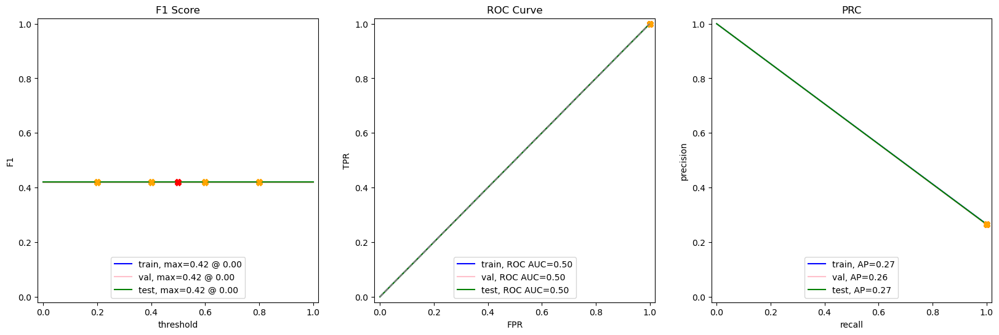

In [201]:
dummy_classifier(train_ord, val_ord, test_ord, balanced=None, samp=None, target_field='churn')

This dummy classifier operates as our sanity check for examining model performance. Every ML model should perform better than this.

### LogisticRegression

churn
0    3095
1    3095
Name: count, dtype: int64
Confusion  matrixes  for  the  model  are  below,  first  by  percentage,  then  by  instances.


,Predicted False,Predicted True
Is False,0.727977,0.272023
Is True,0.229947,0.770053


,Predicted False,Predicted True
Is False,752,281
Is True,86,288


             train       val      test
Accuracy  0.766882  0.758351  0.739161
F1        0.774214  0.642857  0.610817
APS       0.824754  0.666228  0.601821
ROC AUC   0.846820  0.850436  0.820043


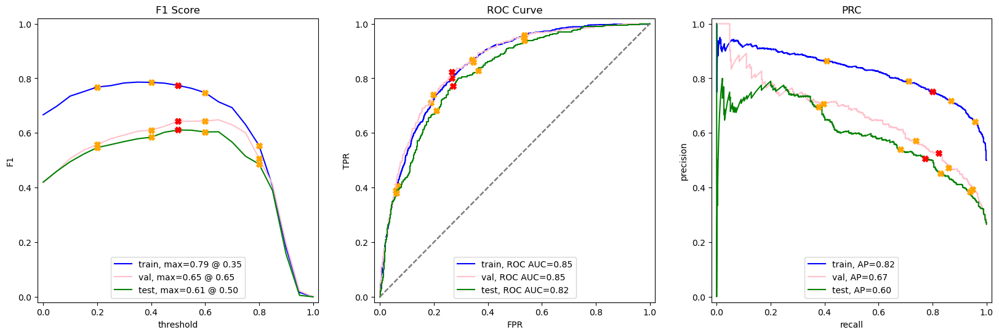

In [205]:
logistic_regression(train_ord, val_ord, test_ord, balanced='balanced', samp='up', target_field='churn')

Just a simple LogisticRegression makes a significant improvement in the metrics of the test set, though this model does not meet our threshold for success.

### GridSearchCV

Only a few search algorithms were added due to the time requirements they take to find the best model parameters. The command %%time was also added to these cells to provide the overall CPU/wall time for these cells.

Best Parameters: {'learning_rate': 0.25, 'max_depth': 3, 'n_estimators': 375, 'num_leaves': 31}
Best Score: 0.9198134600097443
Confusion  matrixes  for  the  model  are  below,  first  by  percentage,  then  by  instances.


,Predicted False,Predicted True
Is False,0.959342,0.040658
Is True,0.312834,0.687166


,Predicted False,Predicted True
Is False,991,42
Is True,117,257


             train       val      test
Accuracy  0.969654  0.879176  0.886994
F1        0.940520  0.748521  0.763744
APS       0.989473  0.870608  0.866840
ROC AUC   0.995546  0.925788  0.918624


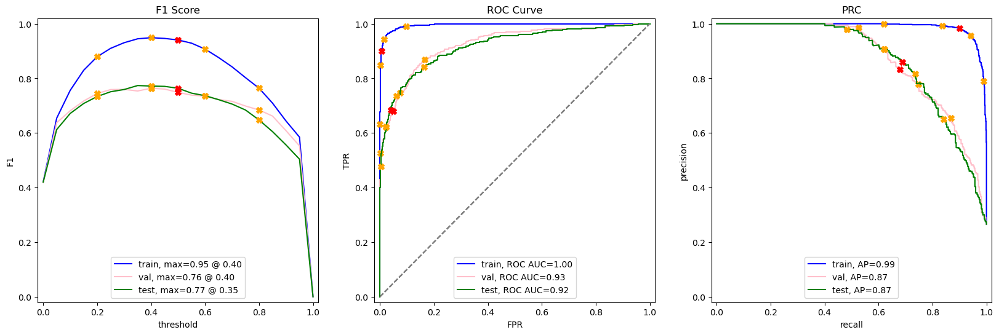

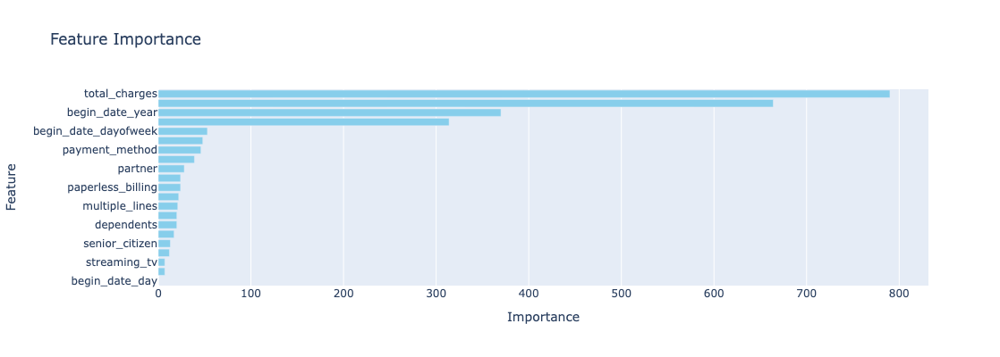

CPU times: user 1min 47s, sys: 30.8 s, total: 2min 18s
Wall time: 22.6 s


In [210]:
%%time

lgbm = LGBMClassifier(verbosity=-1)
target_field='churn'

# Define a parameter grid to search
param_grid = {
    'num_leaves': [31, 35, 30],
    'max_depth': [3],
    'learning_rate': [0.2, 0.15, 0.3, .25],
    'n_estimators': [325, 375, 350]
}

# Set up the GridSearchCV
grid_search = GridSearchCV(estimator=lgbm, 
                           param_grid=param_grid, 
                           scoring='roc_auc',  # or 'roc_auc' for binary classification
                           cv=5, 
                           verbose=0, 
                           n_jobs=None)

# Fit the model
grid_search.fit(train_ord.drop([target_field], axis=1), train_ord[target_field])

# Print the best parameters and best score
print("Best Parameters:", grid_search.best_params_)
print("Best Score:", grid_search.best_score_)

best_lgbm = LGBMClassifier(verbosity=-1, **grid_search.best_params_)

# Fit the model on the training data
best_lgbm.fit(train_ord.drop([target_field], axis=1), train_ord[target_field])

# Predict on the test set
test_predictions = best_lgbm.predict(test_ord.drop([target_field], axis=1))

# Evaluate the model
structure_confusion_matrix(confusion_matrix(test_ord[target_field], test_predictions))
evaluate_model(model=best_lgbm, train_features=train_ord.drop(columns=target_field, axis=1), train_target=train_ord[target_field], 
                   test_features=test_ord.drop(columns=target_field, axis=1), test_target=test_ord[target_field], 
                   val_features=val_ord.drop(columns=target_field, axis=1), val_target=val_ord[target_field])
        
chart_feature_importance(features_train=train_ord.drop(columns=target_field, axis=1), model=best_lgbm)

Fitting 5 folds for each of 1200 candidates, totalling 6000 fits
Best Parameters: {'gamma': 0.1, 'learning_rate': 0.3, 'max_depth': 3, 'min_child_weight': 4, 'n_estimators': 300}
Best Score: 0.9181767059004539
Confusion  matrixes  for  the  model  are  below,  first  by  percentage,  then  by  instances.


,Predicted False,Predicted True
Is False,0.953533,0.046467
Is True,0.326203,0.673797


,Predicted False,Predicted True
Is False,985,48
Is True,122,252


             train       val      test
Accuracy  0.954481  0.886994  0.879176
F1        0.908484  0.763040  0.747774
APS       0.978430  0.866221  0.863446
ROC AUC   0.989626  0.920890  0.916587


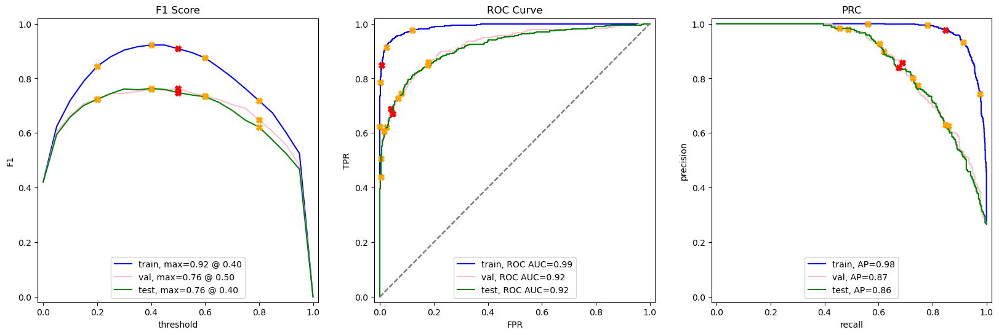

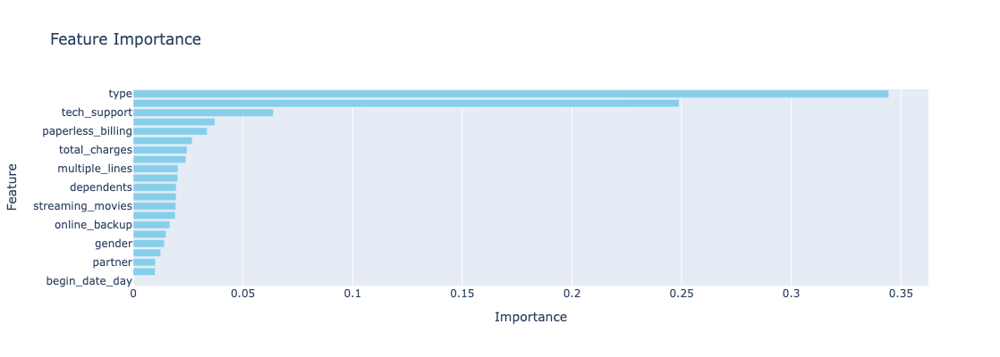

CPU times: user 54min, sys: 13min 32s, total: 1h 7min 33s
Wall time: 9min 34s


In [211]:
%%time

xgb = XGBClassifier(verbosity=1)
target_field='churn'

# Define a parameter grid to search
param_grid = {
    'n_estimators': [100, 200, 300],  # Number of boosting rounds
    'learning_rate': [0.01, 0.05, 0.1, 0.2, 0.3],  # Step size shrinkage
    'max_depth': [3, 4, 5, 6, 7],  # Maximum depth of a tree
    'min_child_weight': [2, 3, 4, 5],  # Minimum sum of instance weight (hessian) needed in a child
    'gamma': [0.1, 0.2, 0.3, 0.4],  # Minimum loss reduction required to make a further partition
 }


# Set up the GridSearchCV
grid_search = GridSearchCV(estimator=xgb, 
                           param_grid=param_grid, 
                           scoring='roc_auc',  # or 'roc_auc' for binary classification
                           cv=5, 
                           verbose=1, 
                           n_jobs=None)

# Fit the model
grid_search.fit(train_ord.drop([target_field], axis=1), train_ord[target_field])

# Print the best parameters and best score
print("Best Parameters:", grid_search.best_params_)
print("Best Score:", grid_search.best_score_)

best_xgb = XGBClassifier(verbosity=1, **grid_search.best_params_)

# Fit the model on the training data
best_xgb.fit(train_ord.drop([target_field], axis=1), train_ord[target_field])

# Predict on the test set
test_predictions = best_xgb.predict(test_ord.drop([target_field], axis=1))

# Evaluate the model
structure_confusion_matrix(confusion_matrix(test_ord[target_field], test_predictions))
evaluate_model(model=best_xgb, train_features=train_ord.drop(columns=target_field, axis=1), train_target=train_ord[target_field], 
                   test_features=test_ord.drop(columns=target_field, axis=1), test_target=test_ord[target_field], 
                   val_features=val_ord.drop(columns=target_field, axis=1), val_target=val_ord[target_field])
        
chart_feature_importance(features_train=train_ord.drop(columns=target_field, axis=1), model=best_xgb)

Best Parameters: {'class_weight': 'balanced', 'max_depth': 9, 'max_features': 'sqrt', 'min_samples_leaf': 6, 'min_samples_split': 3, 'n_estimators': 85}
Best Score: 0.8761446649742288
Confusion  matrixes  for  the  model  are  below,  first  by  percentage,  then  by  instances.


,Predicted False,Predicted True
Is False,0.815102,0.184898
Is True,0.264706,0.735294


,Predicted False,Predicted True
Is False,842,191
Is True,99,275


             train       val      test
Accuracy  0.969654  0.879176  0.886994
F1        0.940520  0.748521  0.763744
APS       0.989473  0.870608  0.866840
ROC AUC   0.995546  0.925788  0.918624


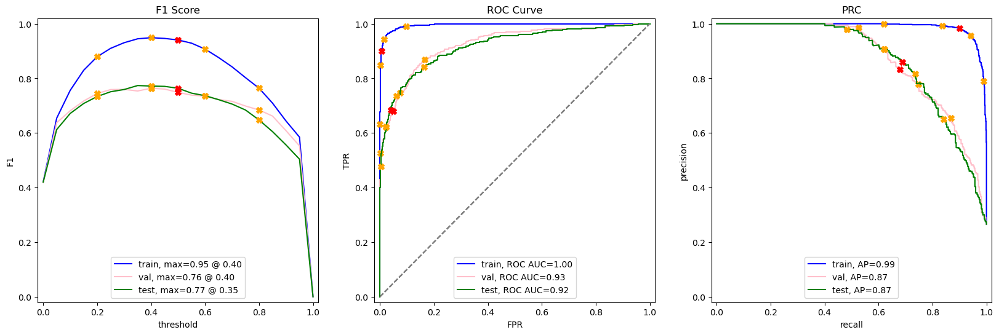

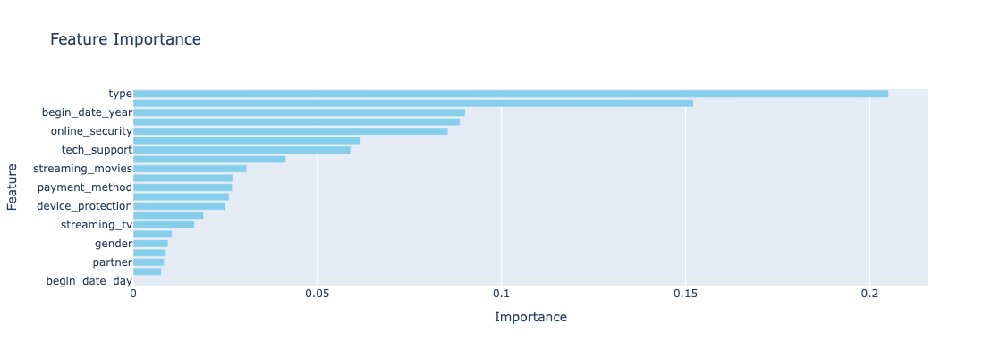

CPU times: user 1min, sys: 805 ms, total: 1min 1s
Wall time: 1min


In [212]:
%%time

rf = RandomForestClassifier()

# Define a parameter grid to search
param_grid = {
    'n_estimators': [85, 100, 125],       
    'max_depth': [8, 9, 7, 6],      
    'min_samples_split': [3],      
    'min_samples_leaf': [7, 6, 5],        
    'max_features': ['auto', 'sqrt', 'log2'],
    'class_weight': ['balanced']
}

# Set up the GridSearchCV
grid_search = GridSearchCV(estimator=rf, 
                           param_grid=param_grid, 
                           scoring='roc_auc',  # or 'roc_auc' for binary classification
                           cv=5, 
                           verbose=0, 
                           n_jobs=None)

# Fit the model
grid_search.fit(train_ord.drop([target_field], axis=1), train_ord[target_field])

# Print the best parameters and best score
print("Best Parameters:", grid_search.best_params_)
print("Best Score:", grid_search.best_score_)

best_rf = RandomForestClassifier(**grid_search.best_params_)

# Fit the model on the training data
best_rf.fit(train_ord.drop([target_field], axis=1), train_ord[target_field])

# Predict on the test set
test_predictions = best_rf.predict(test_ord.drop([target_field], axis=1))

# Evaluate the model
structure_confusion_matrix(confusion_matrix(test_ord[target_field], test_predictions))
evaluate_model(model=best_lgbm, train_features=train_ord.drop(columns=target_field, axis=1), train_target=train_ord[target_field], 
                   test_features=test_ord.drop(columns=target_field, axis=1), test_target=test_ord[target_field], 
                   val_features=val_ord.drop(columns=target_field, axis=1), val_target=val_ord[target_field])
        
chart_feature_importance(features_train=train_ord.drop(columns=target_field, axis=1), model=best_rf)

### HalvingRandomSearchCV

{'n_estimators': 500, 'min_samples_split': 5, 'min_samples_leaf': 1, 'max_features': 'log2', 'max_depth': 15, 'class_weight': 'balanced', 'bootstrap': True}
0.8683061472914864
Confusion  matrixes  for  the  model  are  below,  first  by  percentage,  then  by  instances.


,Predicted False,Predicted True
Is False,0.900290,0.099710
Is True,0.379679,0.620321


,Predicted False,Predicted True
Is False,930,103
Is True,142,232


             train       val      test
Accuracy  0.969654  0.879176  0.886994
F1        0.940520  0.748521  0.763744
APS       0.989473  0.870608  0.866840
ROC AUC   0.995546  0.925788  0.918624


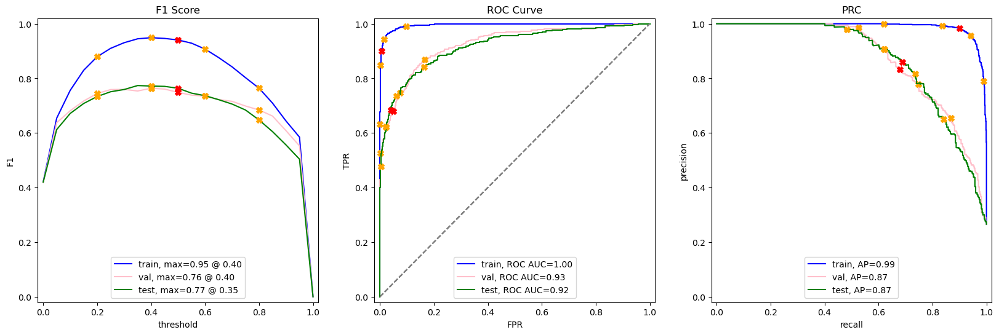

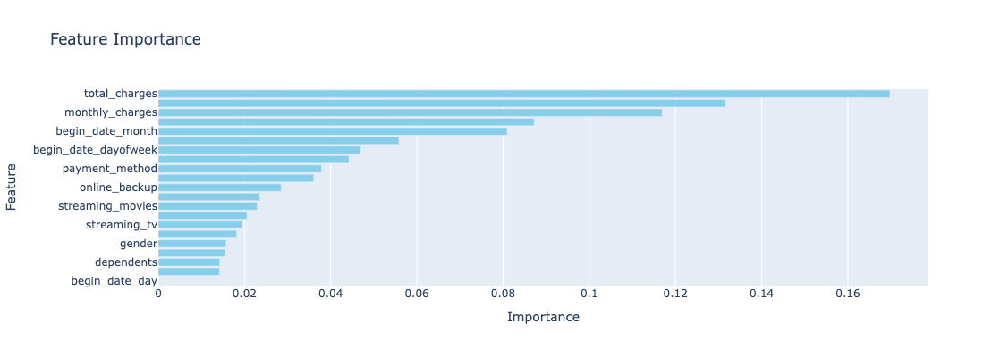

CPU times: user 2min 50s, sys: 1.81 s, total: 2min 52s
Wall time: 2min 53s


In [215]:
%%time

from sklearn.experimental import enable_halving_search_cv 
from sklearn.model_selection import HalvingRandomSearchCV
from scipy.stats import randint

rf = RandomForestClassifier(random_state=42)

param_distributions = {
    'n_estimators': [50, 100, 200, 300, 500],     # Number of trees in the forest
    'max_depth': [None, 5, 10, 15, 20],            # Maximum depth of the trees
    'min_samples_split': [2, 5, 10, 20],           # Minimum number of samples required to split an internal node
    'min_samples_leaf': [1, 2, 4, 6, 8],           # Minimum number of samples required to be at a leaf node
    'max_features': ['auto', 'sqrt', 'log2'],      # Number of features to consider when looking for the best split
    'bootstrap': [True, False],                     # Whether to use bootstrap samples when building trees
    'class_weight': [None, 'balanced']              # Weights associated with classes
}
search = HalvingRandomSearchCV(rf, param_distributions,
    scoring='roc_auc',  # Optimize for ROC AUC score
    cv=5,
    factor=2,           # Reduce candidates by this factor
    resource='n_samples',  # Resource to be halved
    max_resources='auto',  # Automatically determine the maximum resources
    verbose=0,
    n_jobs=None).fit(train_ord.drop([target_field], axis=1), train_ord[target_field])
print(search.best_params_)
print(search.best_score_)
best_rf = RandomForestClassifier(**search.best_params_)

# Fit the model on the training data
best_rf.fit(train_ord.drop([target_field], axis=1), train_ord[target_field])

# Predict on the test set
test_predictions = best_rf.predict(test_ord.drop([target_field], axis=1))

# Evaluate the model
structure_confusion_matrix(confusion_matrix(test_ord[target_field], test_predictions))
evaluate_model(model=best_lgbm, train_features=train_ord.drop(columns=target_field, axis=1), train_target=train_ord[target_field], 
                   test_features=test_ord.drop(columns=target_field, axis=1), test_target=test_ord[target_field], 
                   val_features=val_ord.drop(columns=target_field, axis=1), val_target=val_ord[target_field])
        
chart_feature_importance(features_train=train_ord.drop(columns=target_field, axis=1), model=best_rf)

### RandomForest

I make six models with the RandomForestClassifier varying the sampling methods and encodings. Reports are generated for each model.

churn
1    1123
0    1123
Name: count, dtype: int64
Confusion  matrixes  for  the  model  are  below,  first  by  percentage,  then  by  instances.


,Predicted False,Predicted True
Is False,0.751210,0.248790
Is True,0.208556,0.791444


,Predicted False,Predicted True
Is False,776,257
Is True,78,296


             train       val      test
Accuracy  0.845948  0.783937  0.761905
F1        0.850733  0.668845  0.638619
APS       0.931018  0.748532  0.703484
ROC AUC   0.930902  0.878292  0.850433


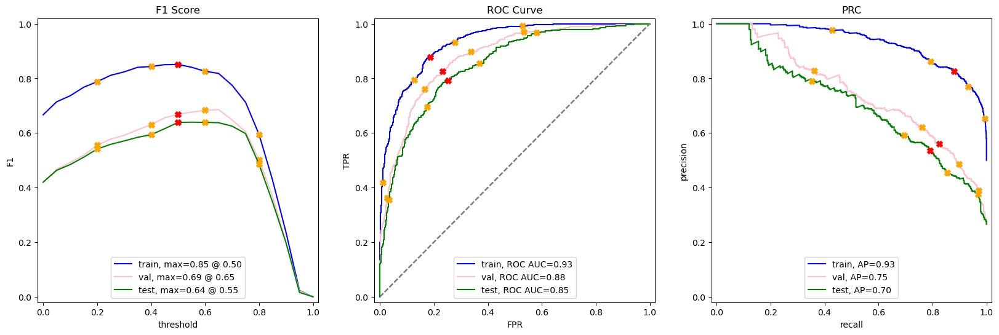

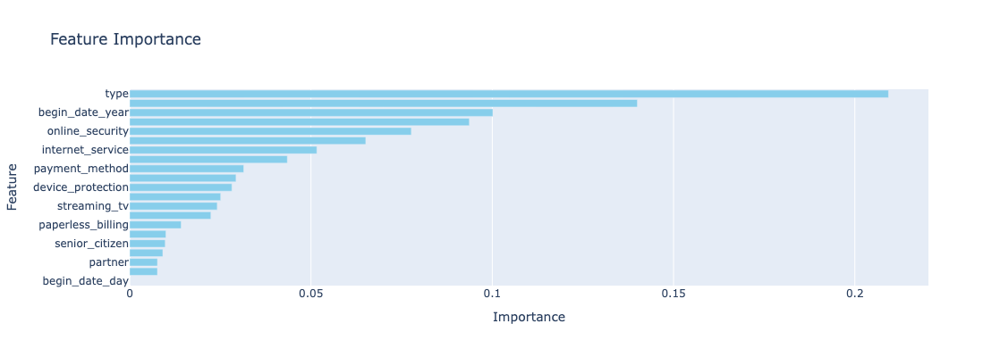

In [219]:
random_forest_model(train_ord, val_ord, test_ord, balanced='balanced', samp='down', target_field='churn')

churn
0    3095
1    3095
Name: count, dtype: int64
Confusion  matrixes  for  the  model  are  below,  first  by  percentage,  then  by  instances.


,Predicted False,Predicted True
Is False,0.798645,0.201355
Is True,0.259358,0.740642


,Predicted False,Predicted True
Is False,825,208
Is True,97,277


             train       val      test
Accuracy  0.866074  0.795309  0.783227
F1        0.871771  0.672727  0.644936
APS       0.936280  0.770800  0.717244
ROC AUC   0.939475  0.882554  0.854127


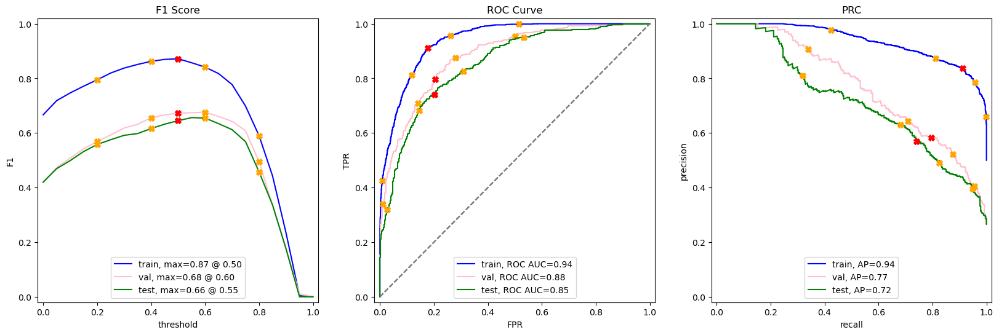

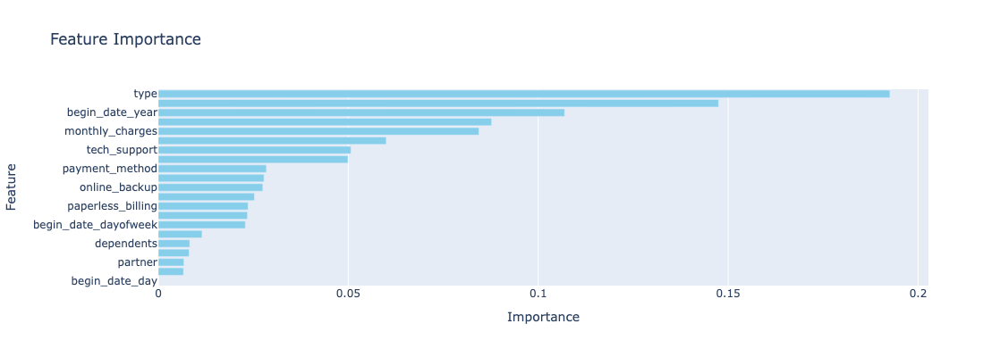

In [221]:
random_forest_model(train_ord, val_ord, test_ord, balanced='balanced', samp='up', target_field='churn')

churn
0    3095
1    3095
Name: count, dtype: int64
Confusion  matrixes  for  the  model  are  below,  first  by  percentage,  then  by  instances.


,Predicted False,Predicted True
Is False,0.828654,0.171346
Is True,0.299465,0.700535


,Predicted False,Predicted True
Is False,856,177
Is True,112,262


             train       val      test
Accuracy  0.877544  0.807392  0.794598
F1        0.880705  0.675449  0.644526
APS       0.948133  0.725460  0.671327
ROC AUC   0.950738  0.872113  0.842621


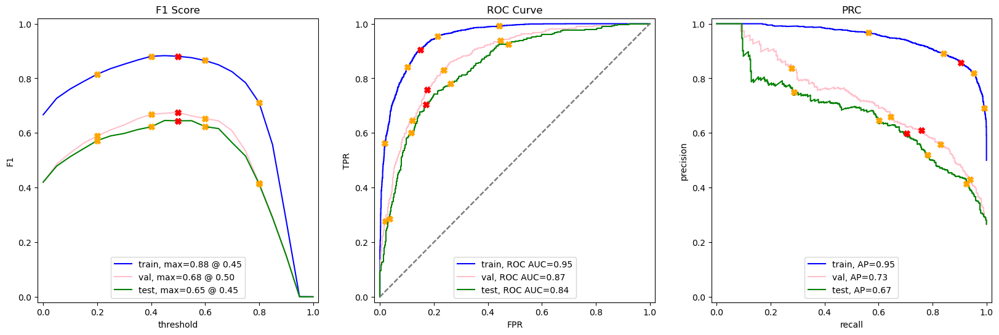

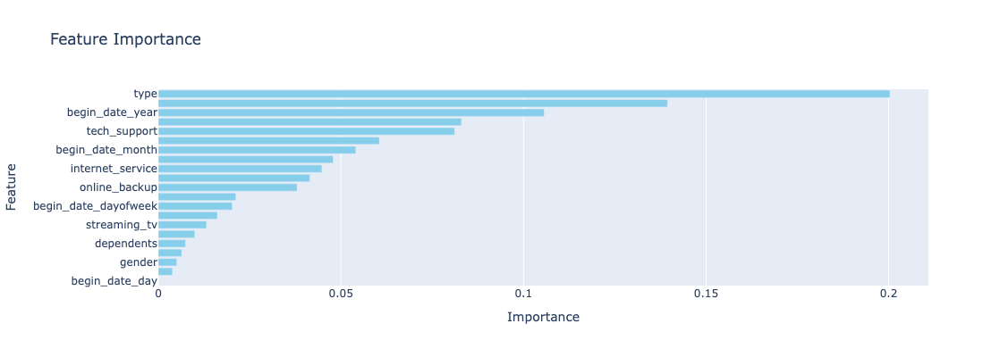

In [222]:
random_forest_model(train_ord, val_ord, test_ord, balanced='balanced', samp='smote', target_field='churn')

churn
0    1123
1    1123
Name: count, dtype: int64
Confusion  matrixes  for  the  model  are  below,  first  by  percentage,  then  by  instances.


,Predicted False,Predicted True
Is False,0.722168,0.277832
Is True,0.221925,0.778075


,Predicted False,Predicted True
Is False,746,287
Is True,83,291


             train       val      test
Accuracy  0.832591  0.768301  0.737029
F1        0.839316  0.651709  0.611345
APS       0.915521  0.747518  0.682317
ROC AUC   0.915906  0.876728  0.845267


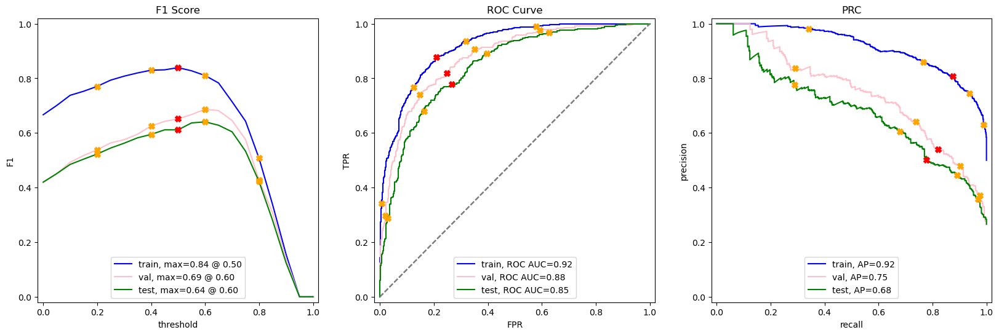

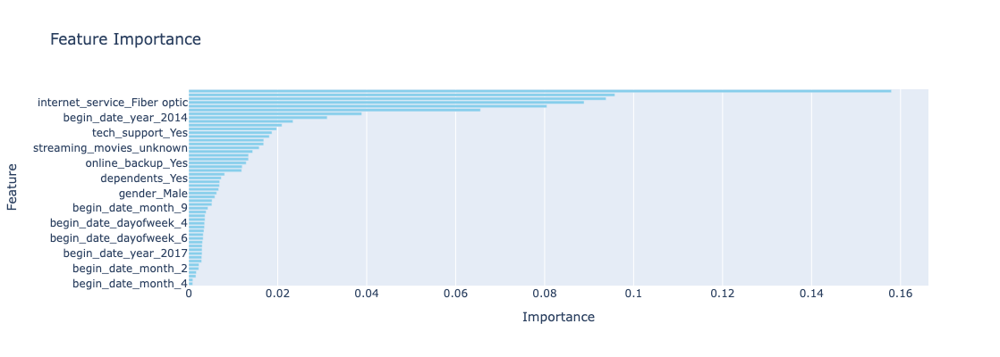

In [223]:
random_forest_model(train_ohe, val_ohe, test_ohe, balanced='balanced', samp='down', target_field='churn')

churn
0    3095
1    3095
Name: count, dtype: int64
Confusion  matrixes  for  the  model  are  below,  first  by  percentage,  then  by  instances.


,Predicted False,Predicted True
Is False,0.775411,0.224589
Is True,0.243316,0.756684


,Predicted False,Predicted True
Is False,801,232
Is True,91,283


             train       val      test
Accuracy  0.838449  0.796731  0.770434
F1        0.845249  0.680804  0.636670
APS       0.918123  0.764017  0.705313
ROC AUC   0.921365  0.882593  0.850412


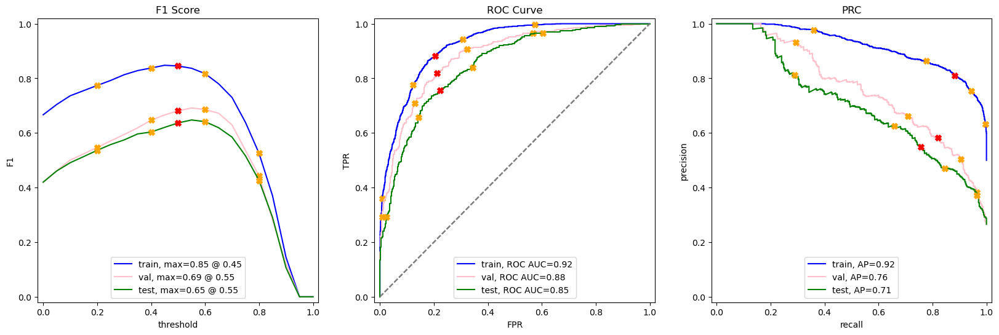

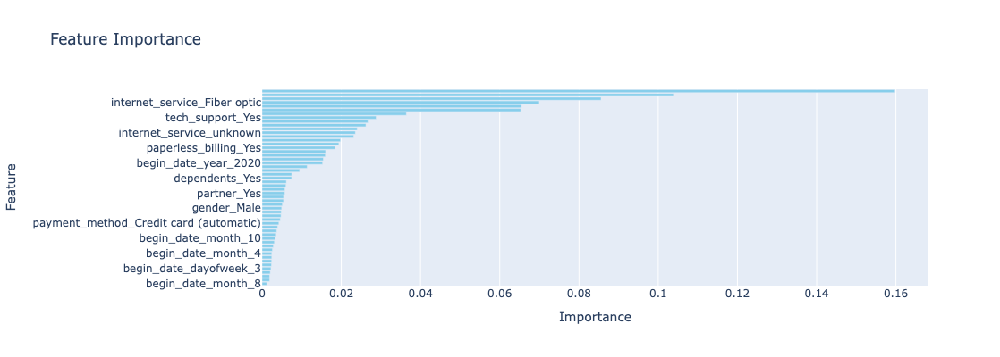

In [224]:
random_forest_model(train_ohe, val_ohe, test_ohe, balanced='balanced', samp='up', target_field='churn')

churn
0    3095
1    3095
Name: count, dtype: int64
Confusion  matrixes  for  the  model  are  below,  first  by  percentage,  then  by  instances.


,Predicted False,Predicted True
Is False,0.824782,0.175218
Is True,0.294118,0.705882


,Predicted False,Predicted True
Is False,852,181
Is True,110,264


             train       val      test
Accuracy  0.878514  0.812367  0.793177
F1        0.881612  0.681159  0.644689
APS       0.950623  0.726666  0.664330
ROC AUC   0.951180  0.872965  0.840476


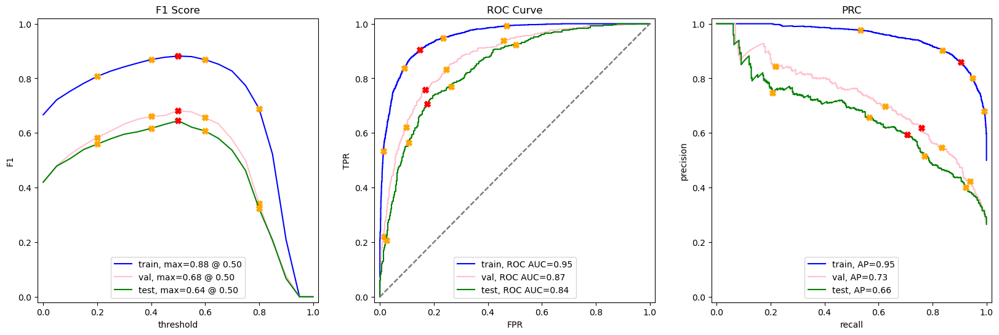

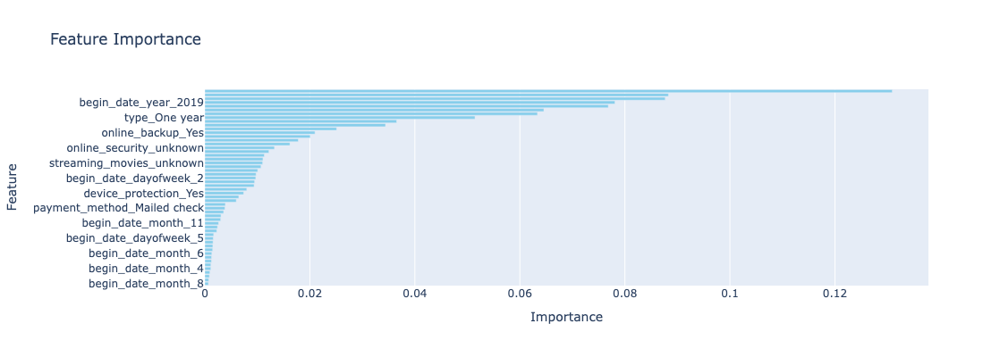

In [225]:
random_forest_model(train_ohe, val_ohe, test_ohe, balanced='balanced', samp='smote', target_field='churn')

### LightGBM

I make six models with the LightGBM classifier varying the sampling methods and encodings. Reports are generated for each model.

churn
0    1123
1    1123
Name: count, dtype: int64
Confusion  matrixes  for  the  model  are  below,  first  by  percentage,  then  by  instances.


,Predicted False,Predicted True
Is False,0.819942,0.180058
Is True,0.213904,0.786096


,Predicted False,Predicted True
Is False,847,186
Is True,80,294


             train       val      test
Accuracy  0.977293  0.818763  0.810945
F1        0.977222  0.703833  0.688525
APS       0.998419  0.829006  0.804947
ROC AUC   0.998390  0.903387  0.888392


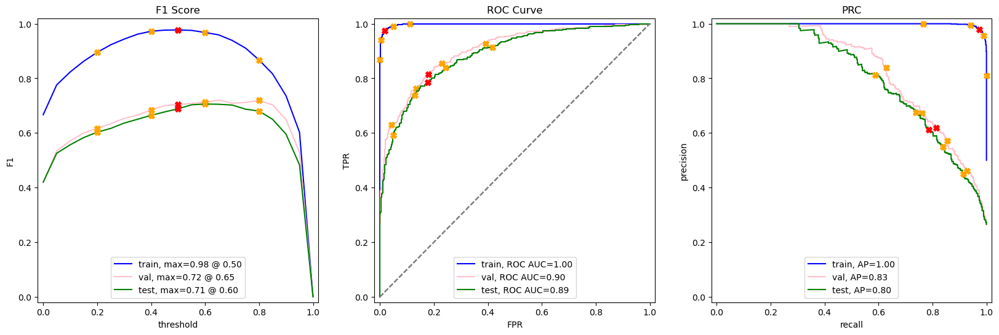

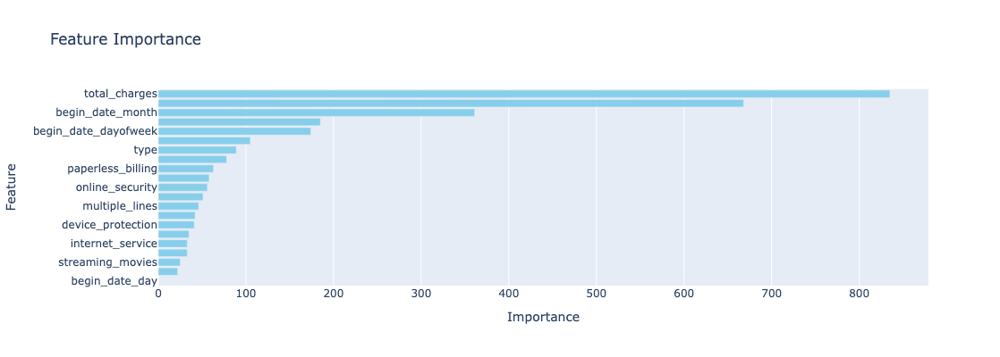

In [228]:
lgbmclassifier(train_ord, val_ord, test_ord, balanced='balanced', samp='down', target_field='churn')

churn
1    3095
0    3095
Name: count, dtype: int64
Confusion  matrixes  for  the  model  are  below,  first  by  percentage,  then  by  instances.


,Predicted False,Predicted True
Is False,0.906099,0.093901
Is True,0.275401,0.724599


,Predicted False,Predicted True
Is False,936,97
Is True,103,271


             train       val      test
Accuracy  0.969467  0.857143  0.857854
F1        0.969707  0.734478  0.730458
APS       0.996638  0.842994  0.838675
ROC AUC   0.996521  0.905350  0.904238


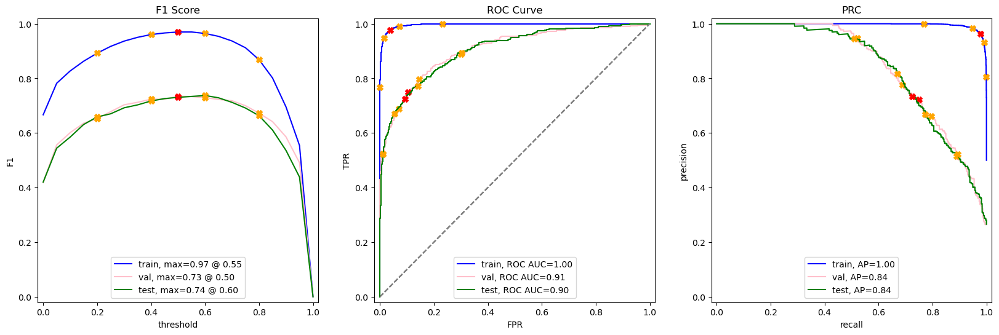

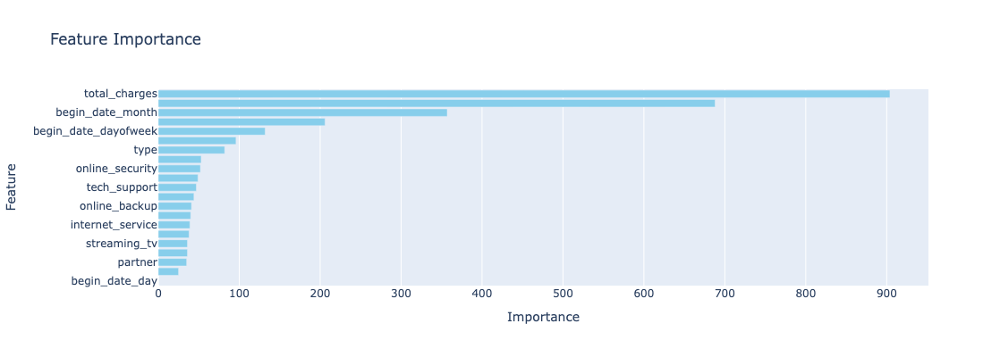

In [229]:
lgbmclassifier(train_ord, val_ord, test_ord, balanced='balanced', samp='up', target_field='churn')

churn
0    3095
1    3095
Name: count, dtype: int64
Confusion  matrixes  for  the  model  are  below,  first  by  percentage,  then  by  instances.


,Predicted False,Predicted True
Is False,0.957406,0.042594
Is True,0.355615,0.644385


,Predicted False,Predicted True
Is False,989,44
Is True,133,241


             train       val      test
Accuracy  0.967205  0.869936  0.874200
F1        0.966540  0.732064  0.731411
APS       0.996730  0.854919  0.845098
ROC AUC   0.996459  0.917194  0.910923


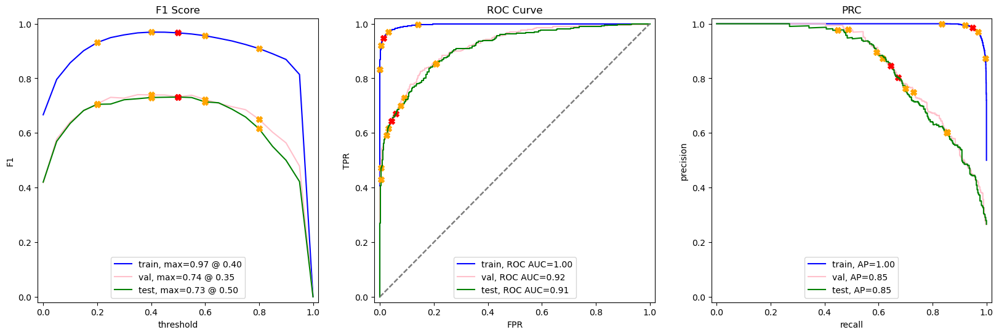

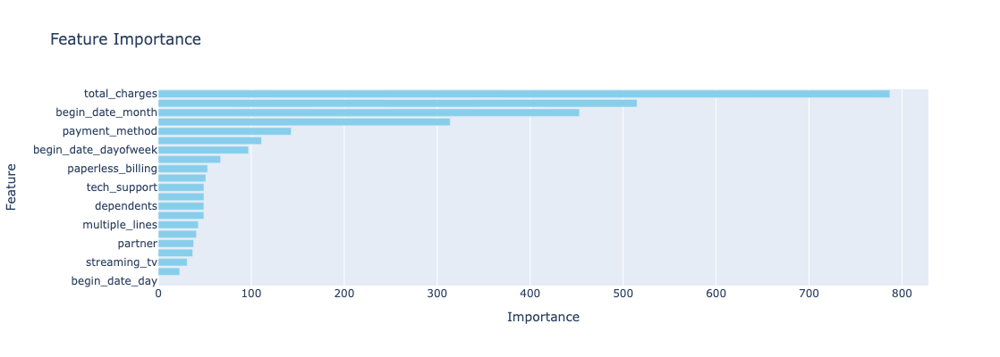

In [230]:
lgbmclassifier(train_ord, val_ord, test_ord, balanced='balanced', samp='smote', target_field='churn')

churn
1    1123
0    1123
Name: count, dtype: int64
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
Confusion  matrixes  for  the  model  are  below,  first  by  percentage,  then  by  instances.


,Predicted False,Predicted True
Is False,0.794773,0.205227
Is True,0.224599,0.775401


,Predicted False,Predicted True
Is False,821,212
Is True,84,290


             train       val      test
Accuracy  0.967498  0.797441  0.789623
F1        0.967541  0.680135  0.662100
APS       0.995854  0.797228  0.775443
ROC AUC   0.995705  0.891260  0.871044


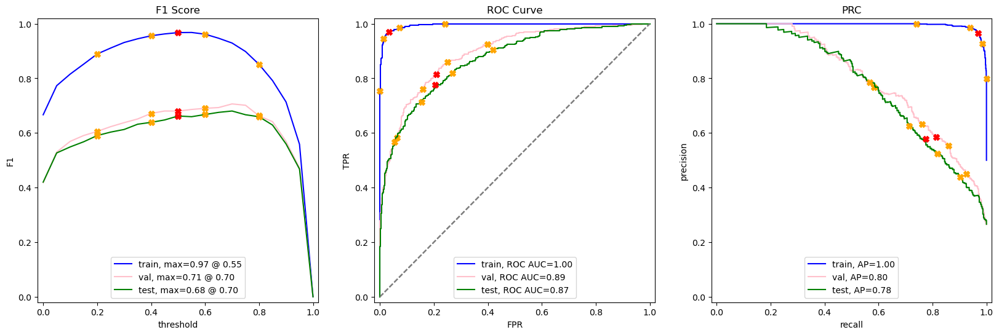

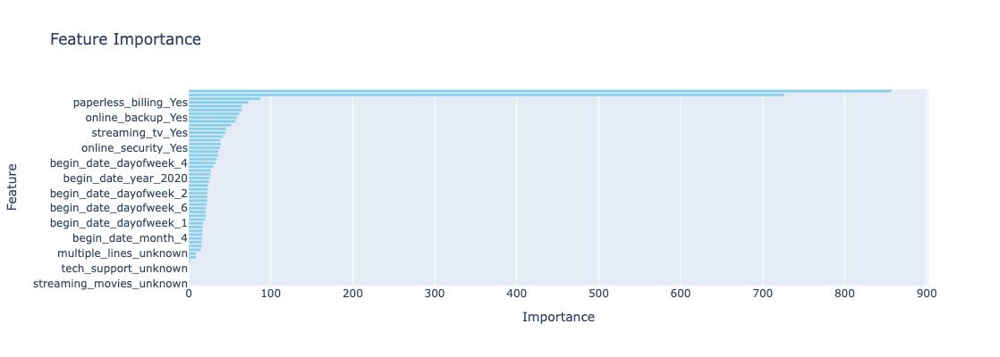

In [231]:
lgbmclassifier(train_ohe, val_ohe, test_ohe, balanced='balanced', samp='down', target_field='churn')

churn
1    3095
0    3095
Name: count, dtype: int64
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
Confusion  matrixes  for  the  model  are  below,  first  by  percentage,  then  by  instances.


,Predicted False,Predicted True
Is False,0.892546,0.107454
Is True,0.294118,0.705882


,Predicted False,Predicted True
Is False,922,111
Is True,110,264


             train       val      test
Accuracy  0.959289  0.851457  0.842928
F1        0.959796  0.731017  0.704940
APS       0.992812  0.831169  0.802446
ROC AUC   0.992833  0.901943  0.888498


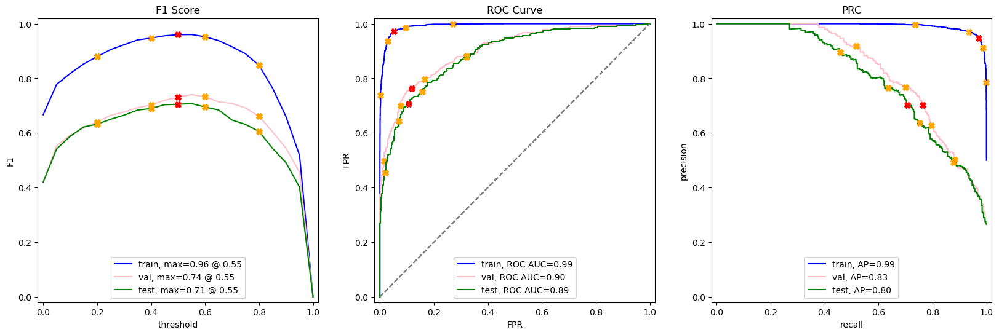

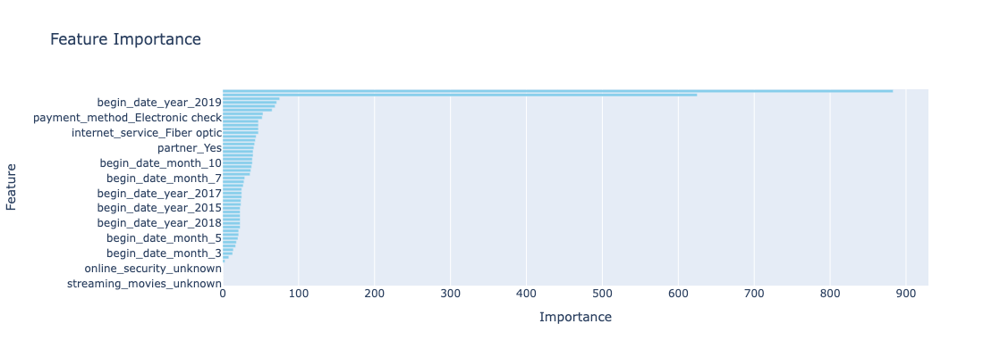

In [232]:
lgbmclassifier(train_ohe, val_ohe, test_ohe, balanced='balanced', samp='up', target_field='churn')

churn
0    3095
1    3095
Name: count, dtype: int64
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
Confusion  matrixes  for  the  model  are  below,  first  by  percentage,  then  by  instances.


,Predicted False,Predicted True
Is False,0.941917,0.058083
Is True,0.433155,0.566845


,Predicted False,Predicted True
Is False,973,60
Is True,162,212


             train       val      test
Accuracy  0.960420  0.859986  0.842217
F1        0.959457  0.711567  0.656347
APS       0.995529  0.834577  0.793051
ROC AUC   0.995102  0.907865  0.883254


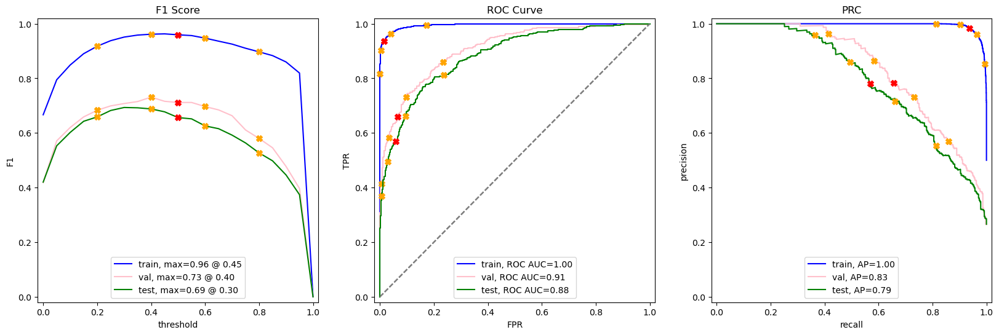

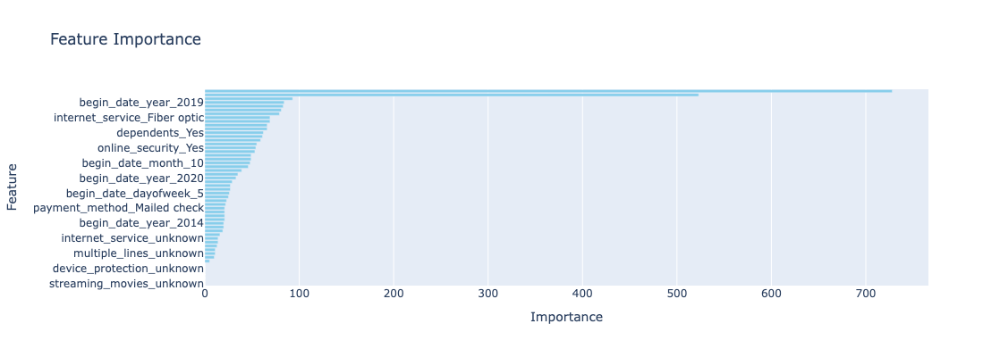

In [233]:
lgbmclassifier(train_ohe, val_ohe, test_ohe, balanced='balanced', samp='smote', target_field='churn')

### XGBoost

I make six models with the XGBoost classifier varying the sampling methods and encodings. Reports are generated for each model.

churn
1    1123
0    1123
Name: count, dtype: int64
Confusion  matrixes  for  the  model  are  below,  first  by  percentage,  then  by  instances.


,Predicted False,Predicted True
Is False,0.808325,0.191675
Is True,0.208556,0.791444


,Predicted False,Predicted True
Is False,835,198
Is True,78,296


             train       val      test
Accuracy  0.999555  0.820896  0.803838
F1        0.999555  0.710345  0.682028
APS       1.000000  0.834221  0.810729
ROC AUC   1.000000  0.907620  0.889807


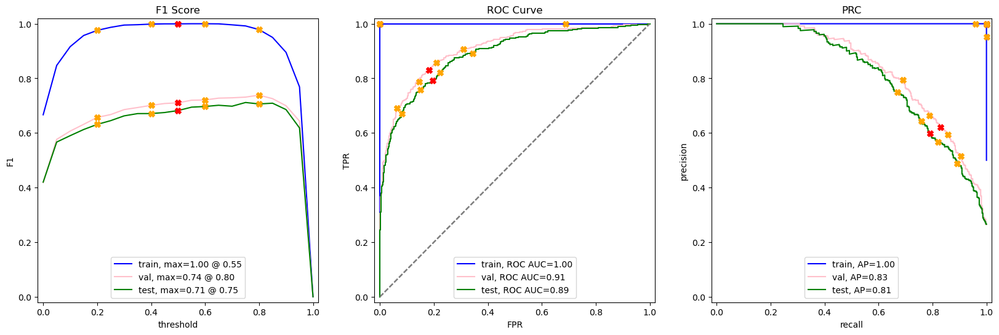

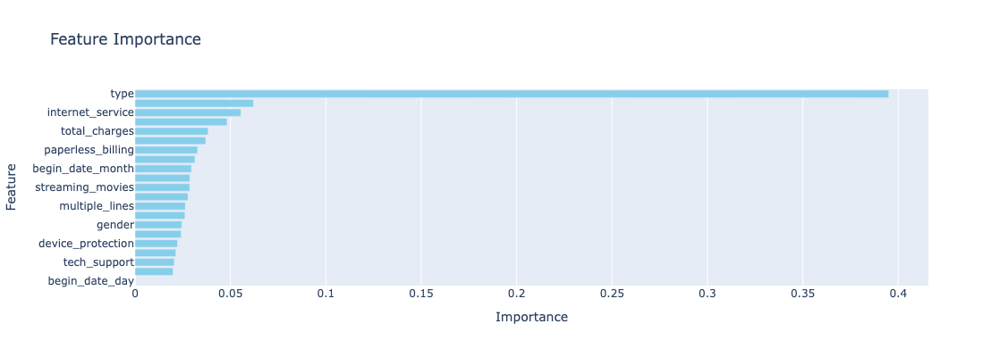

In [258]:
XGBmodel(train_ord, val_ord, test_ord, balanced='balanced', samp='down', target_field='churn')

churn
1    3095
0    3095
Name: count, dtype: int64
Confusion  matrixes  for  the  model  are  below,  first  by  percentage,  then  by  instances.


,Predicted False,Predicted True
Is False,0.933204,0.066796
Is True,0.288770,0.711230


,Predicted False,Predicted True
Is False,964,69
Is True,108,266


             train       val      test
Accuracy  0.997415  0.875622  0.874200
F1        0.997417  0.753173  0.750353
APS       0.999968  0.859688  0.852396
ROC AUC   0.999967  0.916519  0.914185


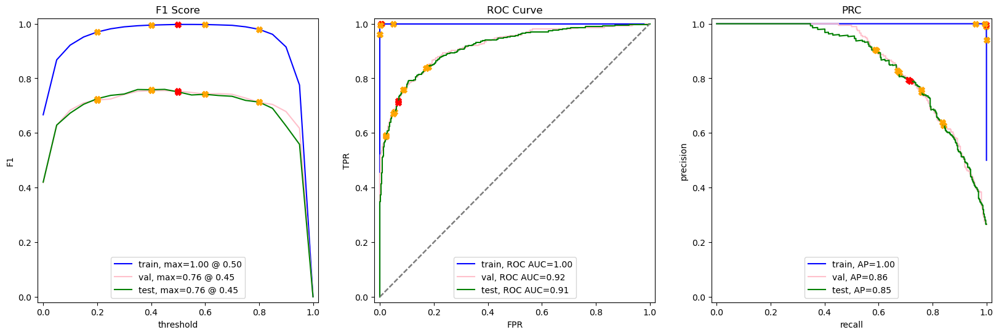

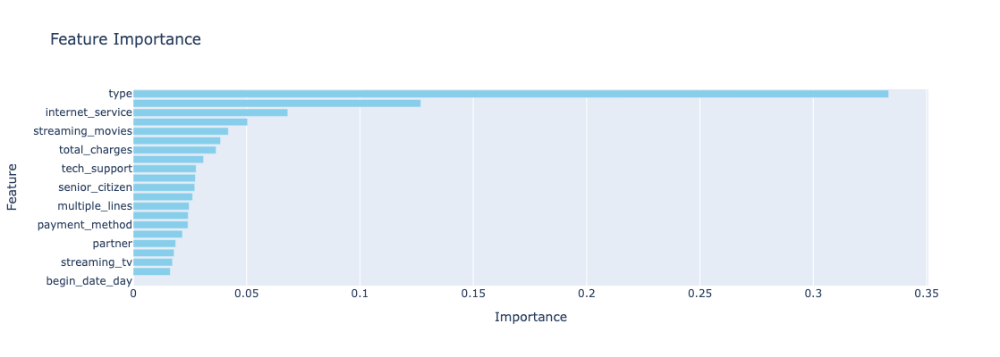

In [259]:
XGBmodel(train_ord, val_ord, test_ord, balanced='balanced', samp='up', target_field='churn')

churn
0    3095
1    3095
Name: count, dtype: int64
Confusion  matrixes  for  the  model  are  below,  first  by  percentage,  then  by  instances.


,Predicted False,Predicted True
Is False,0.953533,0.046467
Is True,0.328877,0.671123


,Predicted False,Predicted True
Is False,985,48
Is True,123,251


             train       val      test
Accuracy  0.996607  0.885572  0.878465
F1        0.996598  0.760773  0.745914
APS       0.999971  0.871031  0.859868
ROC AUC   0.999971  0.922487  0.915854


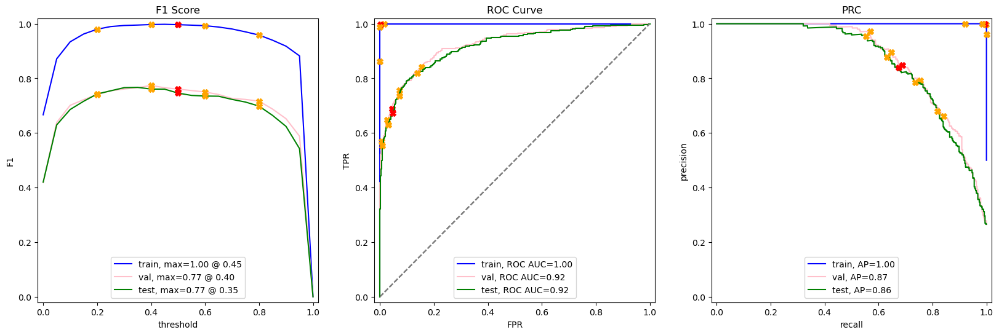

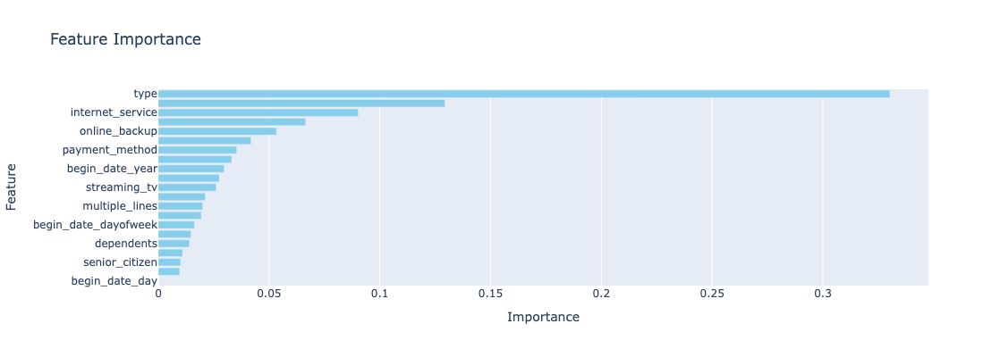

In [260]:
XGBmodel(train_ord, val_ord, test_ord, balanced='balanced', samp='smote', target_field='churn')

churn
0    1123
1    1123
Name: count, dtype: int64
Confusion  matrixes  for  the  model  are  below,  first  by  percentage,  then  by  instances.


,Predicted False,Predicted True
Is False,0.803485,0.196515
Is True,0.221925,0.778075


,Predicted False,Predicted True
Is False,830,203
Is True,83,291


             train       val      test
Accuracy  0.998664  0.809524  0.796731
F1        0.998665  0.697517  0.670507
APS       0.999980  0.808298  0.769105
ROC AUC   0.999980  0.896359  0.869465


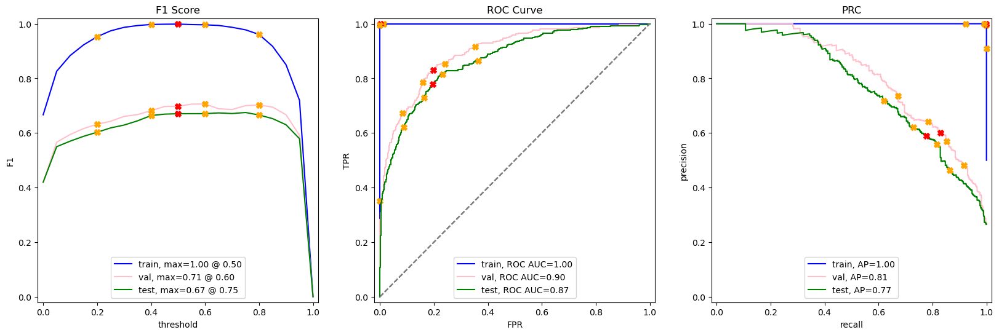

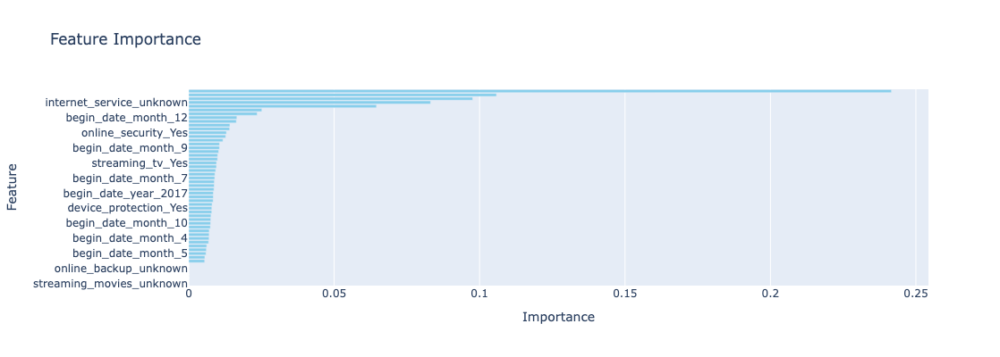

In [262]:
XGBmodel(train_ohe, val_ohe, test_ohe, balanced='balanced', samp='down', target_field='churn')

churn
1    3095
0    3095
Name: count, dtype: int64
Confusion  matrixes  for  the  model  are  below,  first  by  percentage,  then  by  instances.


,Predicted False,Predicted True
Is False,0.911907,0.088093
Is True,0.326203,0.673797


,Predicted False,Predicted True
Is False,942,91
Is True,122,252


             train       val      test
Accuracy  0.993215  0.861407  0.848614
F1        0.993221  0.731034  0.702929
APS       0.999829  0.833000  0.815446
ROC AUC   0.999823  0.904582  0.892572


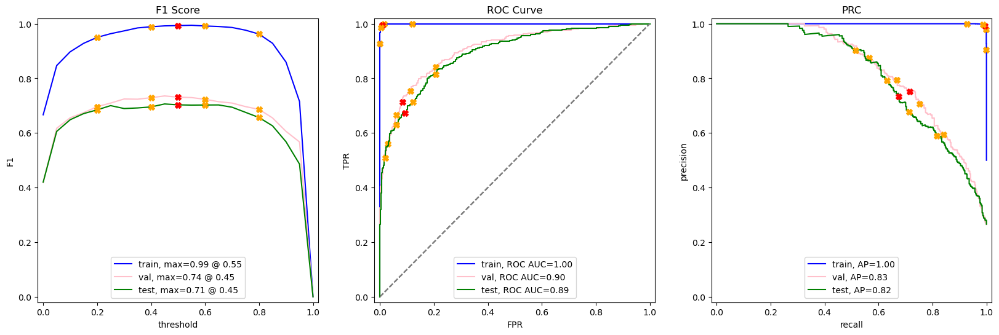

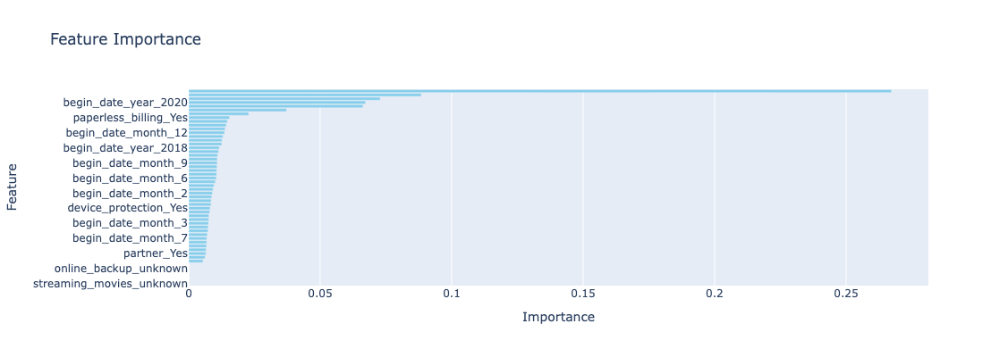

In [263]:
XGBmodel(train_ohe, val_ohe, test_ohe, balanced='balanced', samp='up', target_field='churn')

churn
0    3095
1    3095
Name: count, dtype: int64
Confusion  matrixes  for  the  model  are  below,  first  by  percentage,  then  by  instances.


,Predicted False,Predicted True
Is False,0.942885,0.057115
Is True,0.377005,0.622995


,Predicted False,Predicted True
Is False,974,59
Is True,141,233


             train       val      test
Accuracy  0.991438  0.859275  0.857854
F1        0.991381  0.712209  0.699700
APS       0.999693  0.833419  0.817510
ROC AUC   0.999673  0.905683  0.891200


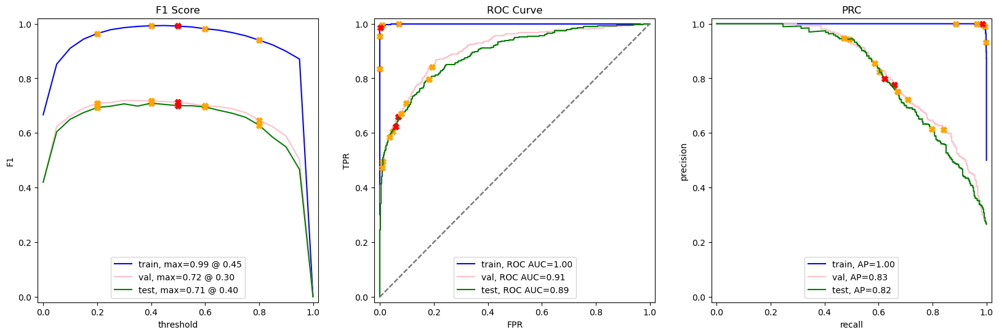

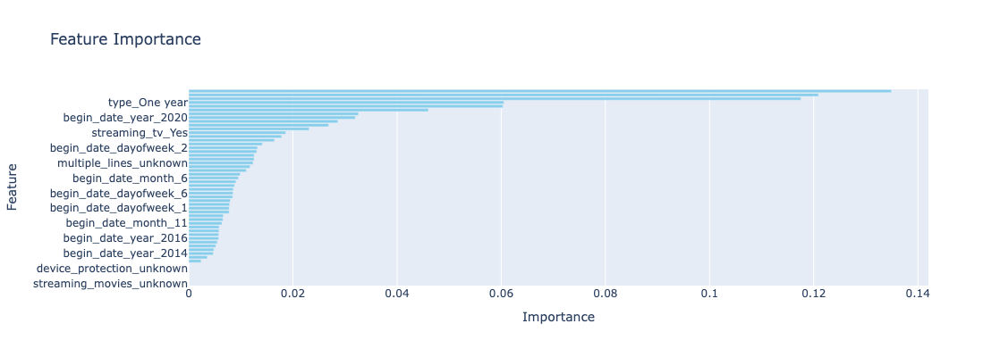

In [264]:
XGBmodel(train_ohe, val_ohe, test_ohe, balanced='balanced', samp='smote', target_field='churn')

### Stochastic Descent Gradient

I make only one model with the SDG classifier and upsampling the target.

churn
1    3095
0    3095
Name: count, dtype: int64
Confusion  matrixes  for  the  model  are  below,  first  by  percentage,  then  by  instances.


,Predicted False,Predicted True
Is False,0.727977,0.272023
Is True,0.229947,0.770053


,Predicted False,Predicted True
Is False,752,281
Is True,86,288


             train       val      test
Accuracy  0.768336  0.757640  0.739161
F1        0.775867  0.642183  0.610817
APS       0.824742  0.666308  0.602141
ROC AUC   0.846827  0.850410  0.819981


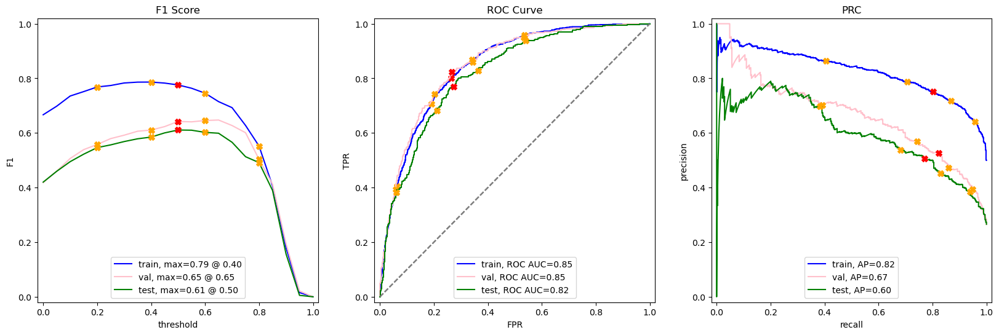

In [268]:
sdg_classifier(train_ord, val_ord, test_ord, balanced='balanced', samp='up', target_field='churn')

### CatBoostClassifier

I make six models with the CatBoostClassifier varying the sampling methods and encodings. Reports are generated for each model.

churn
0    1123
1    1123
Name: count, dtype: int64
Confusion  matrixes  for  the  model  are  below,  first  by  percentage,  then  by  instances.


,Predicted False,Predicted True
Is False,0.818006,0.181994
Is True,0.195187,0.804813


,Predicted False,Predicted True
Is False,845,188
Is True,73,301


             train       val      test
Accuracy  0.986643  0.823028  0.814499
F1        0.986667  0.714777  0.697567
APS       0.999447  0.837974  0.810026
ROC AUC   0.999444  0.912677  0.895253


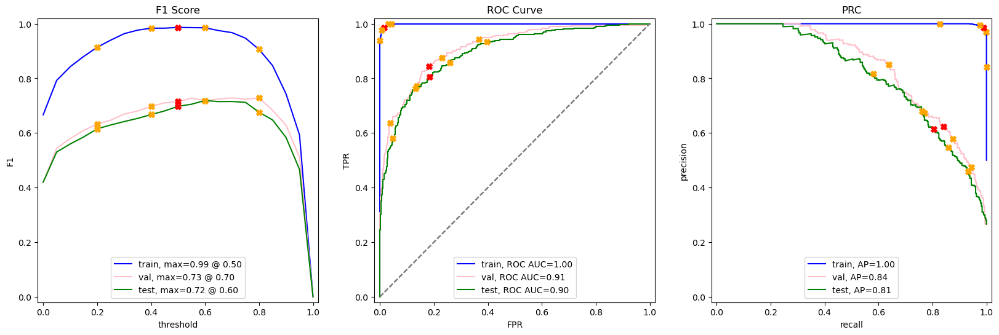

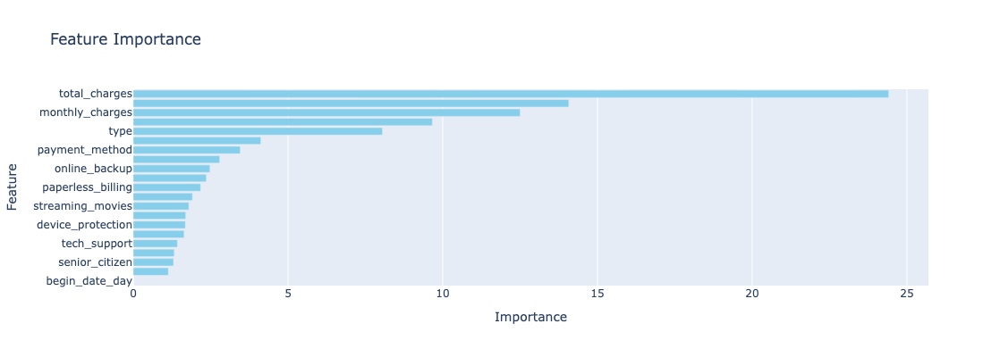

In [271]:
CatBoostClassifier_model(train_ord, val_ord, test_ord, balanced='balanced', samp='down', target_field='churn')

churn
1    3095
0    3095
Name: count, dtype: int64
Confusion  matrixes  for  the  model  are  below,  first  by  percentage,  then  by  instances.


,Predicted False,Predicted True
Is False,0.915779,0.084221
Is True,0.270053,0.729947


,Predicted False,Predicted True
Is False,946,87
Is True,101,273


             train       val      test
Accuracy  0.983845  0.863539  0.866382
F1        0.983938  0.742627  0.743869
APS       0.998587  0.856261  0.841760
ROC AUC   0.998586  0.918825  0.905478


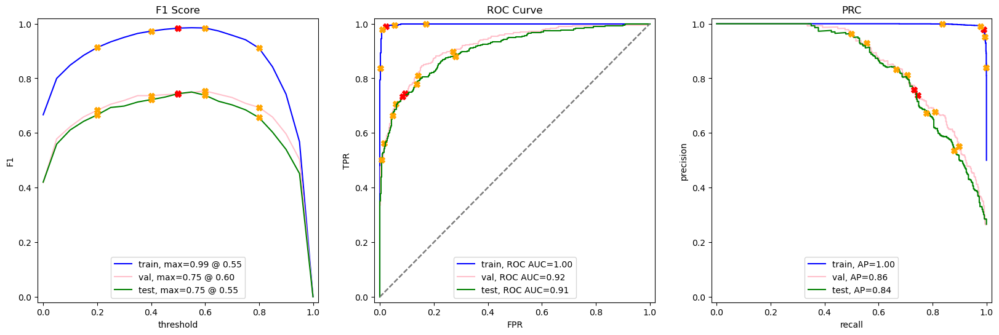

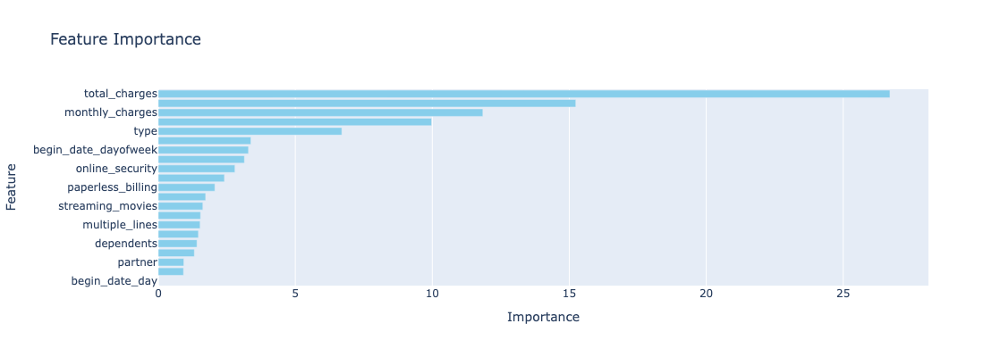

In [272]:
CatBoostClassifier_model(train_ord, val_ord, test_ord, balanced='balanced', samp='up', target_field='churn')

churn
0    3095
1    3095
Name: count, dtype: int64
Confusion  matrixes  for  the  model  are  below,  first  by  percentage,  then  by  instances.


,Predicted False,Predicted True
Is False,0.957406,0.042594
Is True,0.331551,0.668449


,Predicted False,Predicted True
Is False,989,44
Is True,124,250


             train       val      test
Accuracy  0.991599  0.884151  0.880597
F1        0.991553  0.762737  0.748503
APS       0.999704  0.875439  0.858626
ROC AUC   0.999676  0.928479  0.915919


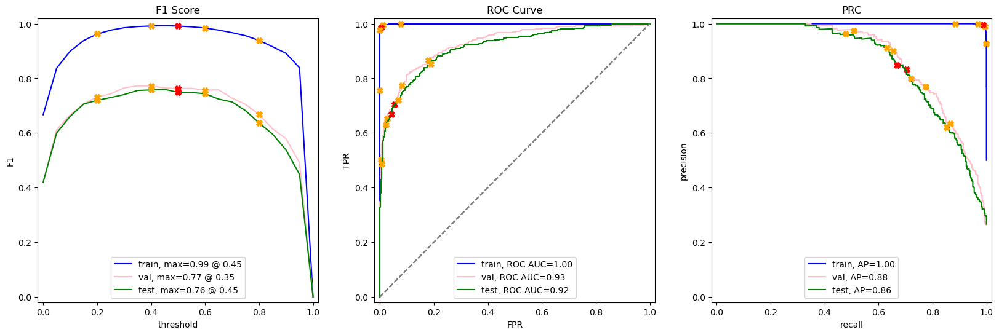

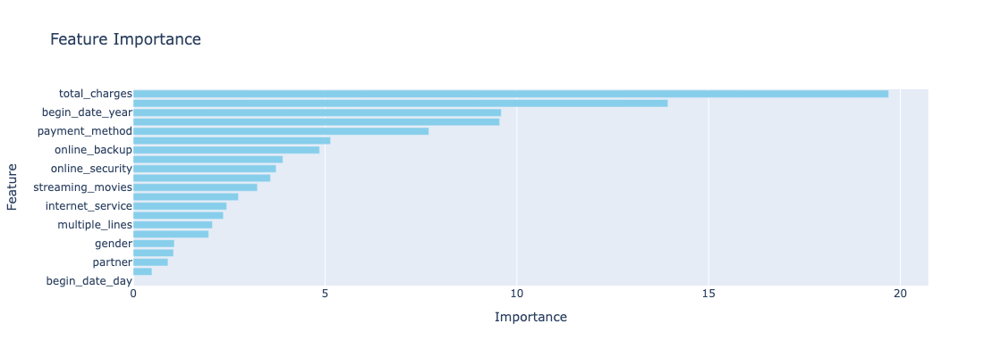

In [273]:
CatBoostClassifier_model(train_ord, val_ord, test_ord, balanced='balanced', samp='smote', target_field='churn')

churn
1    1123
0    1123
Name: count, dtype: int64
Confusion  matrixes  for  the  model  are  below,  first  by  percentage,  then  by  instances.


,Predicted False,Predicted True
Is False,0.776379,0.223621
Is True,0.229947,0.770053


,Predicted False,Predicted True
Is False,802,231
Is True,86,288


             train       val      test
Accuracy  0.967053  0.796731  0.774698
F1        0.967111  0.681514  0.645017
APS       0.996058  0.803936  0.755866
ROC AUC   0.995887  0.893780  0.868306


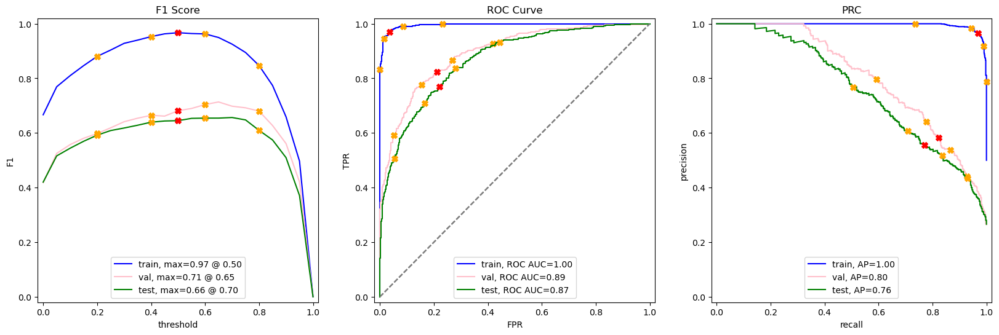

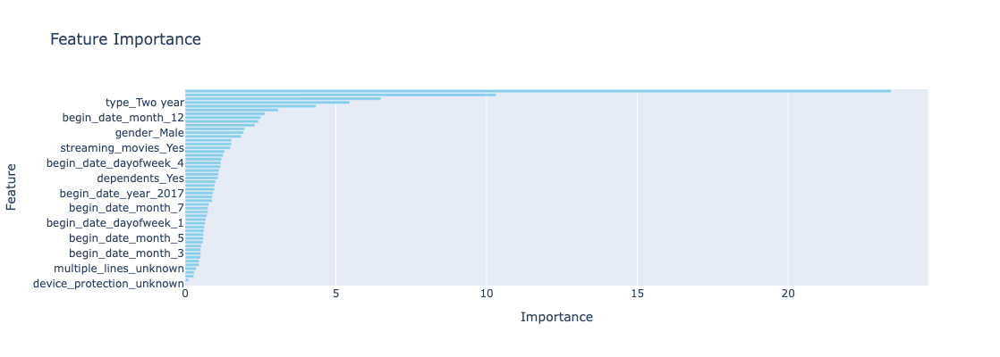

In [275]:
CatBoostClassifier_model(train_ohe, val_ohe, test_ohe, balanced='balanced', samp='down', target_field='churn')

churn
1    3095
0    3095
Name: count, dtype: int64
Confusion  matrixes  for  the  model  are  below,  first  by  percentage,  then  by  instances.


,Predicted False,Predicted True
Is False,0.890610,0.109390
Is True,0.318182,0.681818


,Predicted False,Predicted True
Is False,920,113
Is True,119,255


             train       val      test
Accuracy  0.971082  0.855011  0.835110
F1        0.971410  0.733681  0.687332
APS       0.996772  0.828059  0.797695
ROC AUC   0.996661  0.904727  0.887276


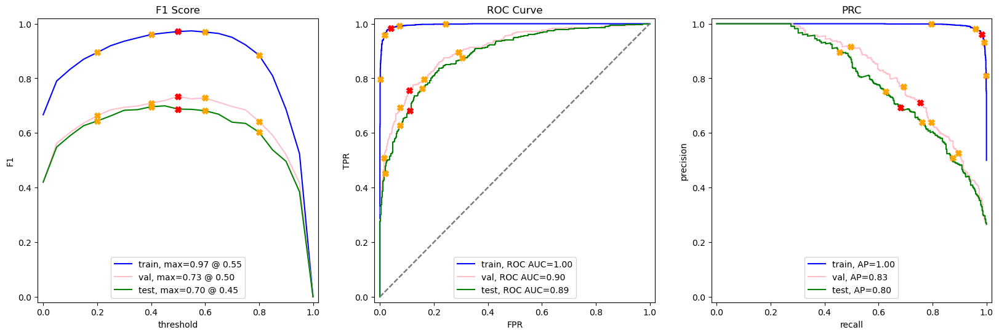

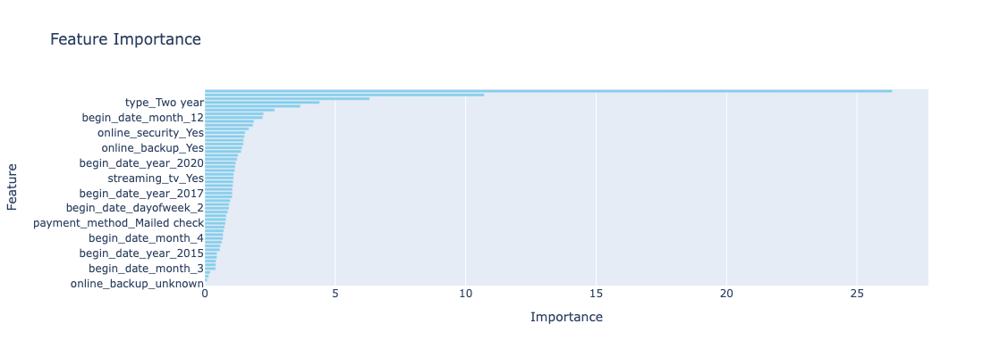

In [276]:
CatBoostClassifier_model(train_ohe, val_ohe, test_ohe, balanced='balanced', samp='up', target_field='churn')

churn
0    3095
1    3095
Name: count, dtype: int64
Confusion  matrixes  for  the  model  are  below,  first  by  percentage,  then  by  instances.


,Predicted False,Predicted True
Is False,0.944821,0.055179
Is True,0.395722,0.604278


,Predicted False,Predicted True
Is False,976,57
Is True,148,226


             train       val      test
Accuracy  0.990630  0.863539  0.854300
F1        0.990572  0.720117  0.687976
APS       0.999618  0.837245  0.808027
ROC AUC   0.999602  0.907483  0.887077


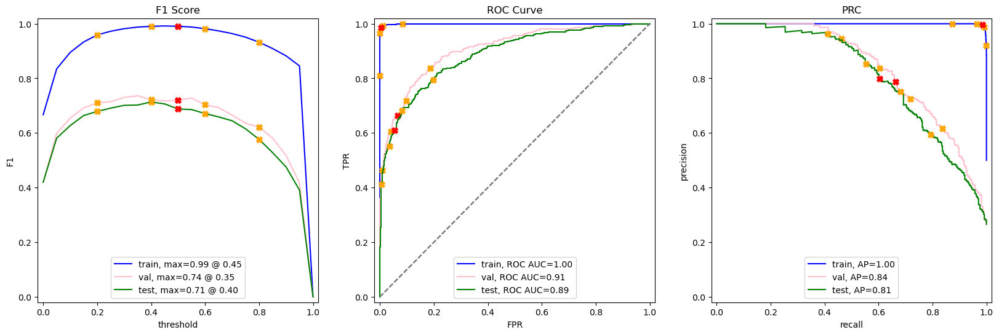

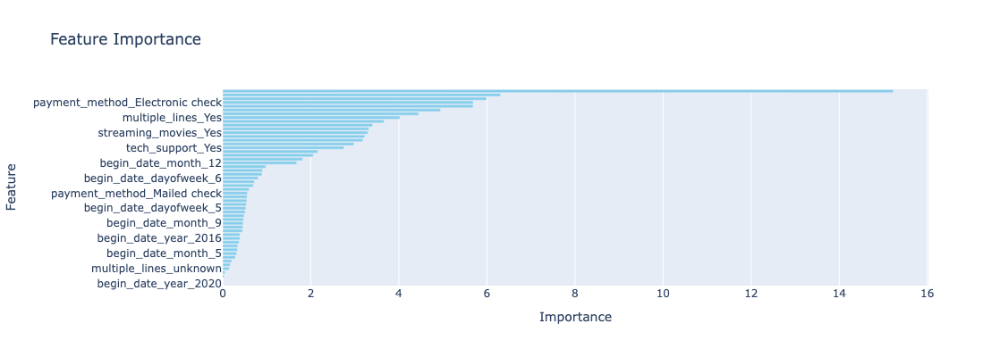

In [277]:
CatBoostClassifier_model(train_ohe, val_ohe, test_ohe, balanced='balanced', samp='smote', target_field='churn')

### Extra Trees

I make six models with the ExtraTreesClassifier varying the sampling methods and encodings. Reports are generated for each model.

churn
1    1123
0    1123
Name: count, dtype: int64
Confusion  matrixes  for  the  model  are  below,  first  by  percentage,  then  by  instances.


,Predicted False,Predicted True
Is False,0.701839,0.298161
Is True,0.192513,0.807487


,Predicted False,Predicted True
Is False,725,308
Is True,72,302


             train       val      test
Accuracy  0.820570  0.761905  0.729922
F1        0.829165  0.657814  0.613821
APS       0.888015  0.692051  0.632950
ROC AUC   0.898406  0.862955  0.835382


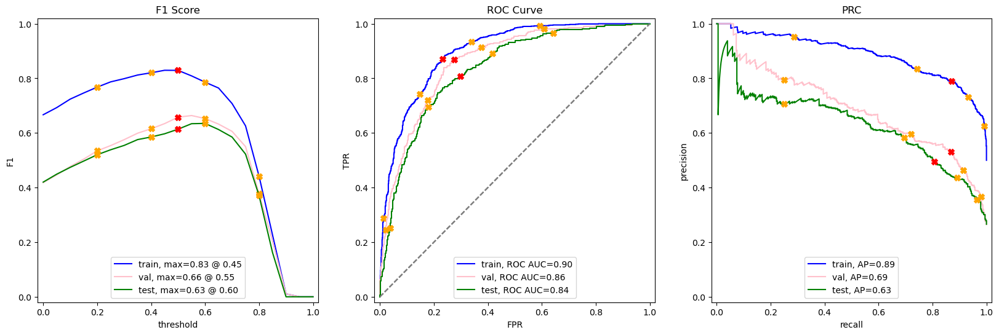

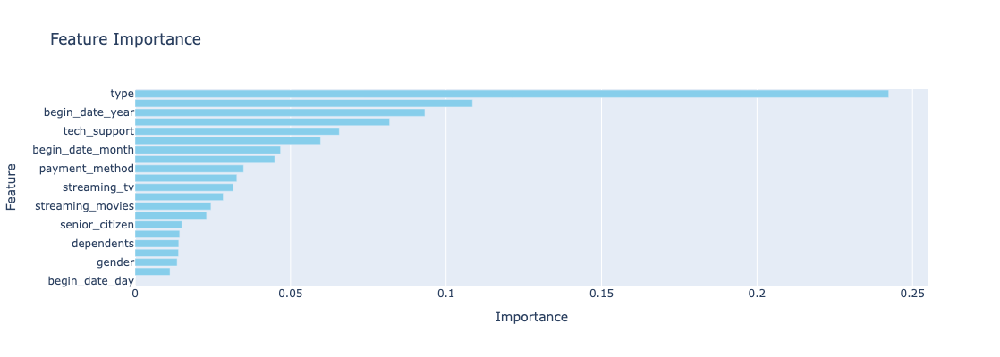

In [282]:
extra_trees_model(train_ord, val_ord, test_ord, balanced='balanced', samp='down', target_field='churn')

churn
1    3095
0    3095
Name: count, dtype: int64
Confusion  matrixes  for  the  model  are  below,  first  by  percentage,  then  by  instances.


,Predicted False,Predicted True
Is False,0.736689,0.263311
Is True,0.224599,0.775401


,Predicted False,Predicted True
Is False,761,272
Is True,84,290


             train       val      test
Accuracy  0.827464  0.773987  0.746979
F1        0.837145  0.660981  0.619658
APS       0.884959  0.699050  0.640970
ROC AUC   0.902943  0.862140  0.834916


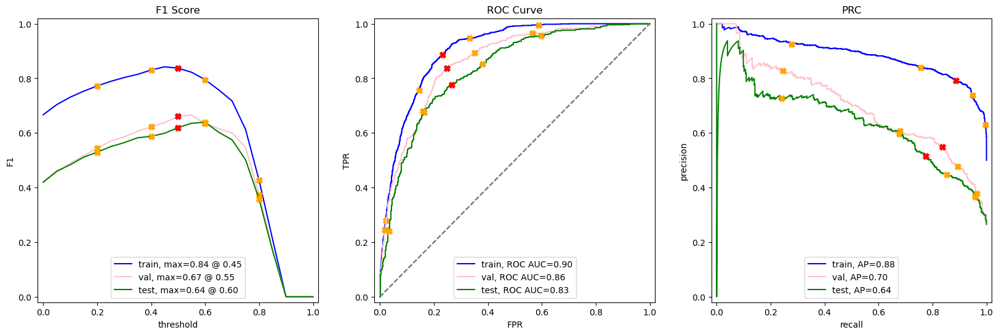

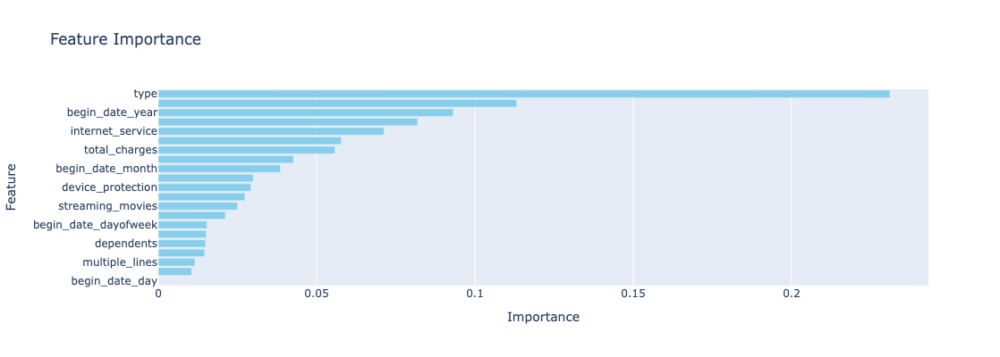

In [283]:
extra_trees_model(train_ord, val_ord, test_ord, balanced='balanced', samp='up', target_field='churn')

churn
0    3095
1    3095
Name: count, dtype: int64
Confusion  matrixes  for  the  model  are  below,  first  by  percentage,  then  by  instances.


,Predicted False,Predicted True
Is False,0.760891,0.239109
Is True,0.221925,0.778075


,Predicted False,Predicted True
Is False,786,247
Is True,83,291


             train       val      test
Accuracy  0.834572  0.782516  0.765458
F1        0.842267  0.662996  0.638158
APS       0.899192  0.691097  0.639573
ROC AUC   0.912723  0.862208  0.834657


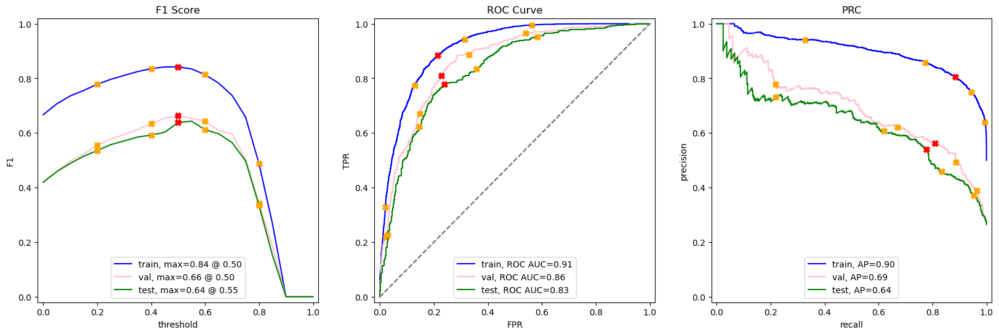

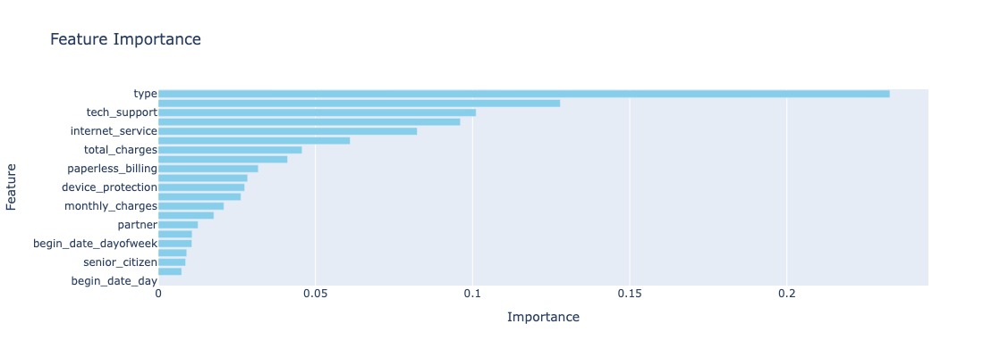

In [284]:
extra_trees_model(train_ord, val_ord, test_ord, balanced='balanced', samp='smote', target_field='churn')

churn
0    1123
1    1123
Name: count, dtype: int64
Confusion  matrixes  for  the  model  are  below,  first  by  percentage,  then  by  instances.


,Predicted False,Predicted True
Is False,0.685382,0.314618
Is True,0.192513,0.807487


,Predicted False,Predicted True
Is False,708,325
Is True,72,302


             train       val      test
Accuracy  0.810329  0.762615  0.717839
F1        0.821159  0.655670  0.603397
APS       0.888585  0.718508  0.651519
ROC AUC   0.896356  0.869809  0.836464


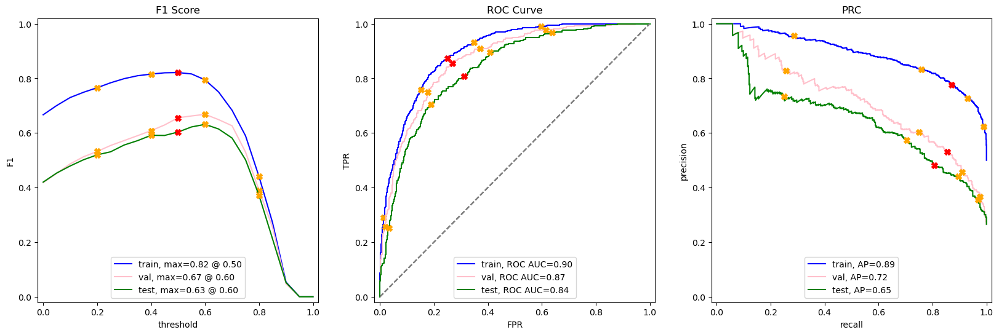

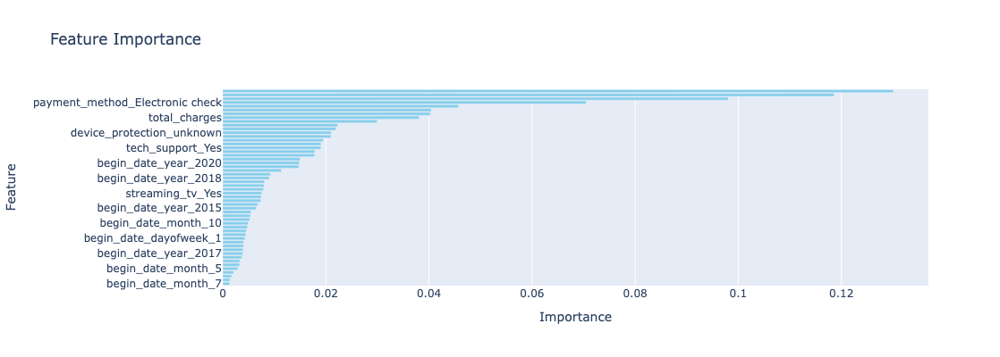

In [285]:
extra_trees_model(train_ohe, val_ohe, test_ohe, balanced='balanced', samp='down', target_field='churn')

churn
0    3095
1    3095
Name: count, dtype: int64
Confusion  matrixes  for  the  model  are  below,  first  by  percentage,  then  by  instances.


,Predicted False,Predicted True
Is False,0.745402,0.254598
Is True,0.229947,0.770053


,Predicted False,Predicted True
Is False,770,263
Is True,86,288


             train       val      test
Accuracy  0.819225  0.781095  0.751955
F1        0.829499  0.670940  0.622703
APS       0.888077  0.719627  0.653067
ROC AUC   0.900505  0.871077  0.836473


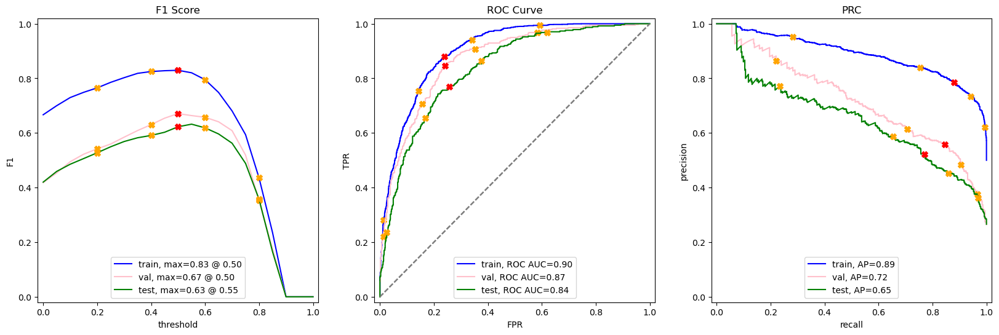

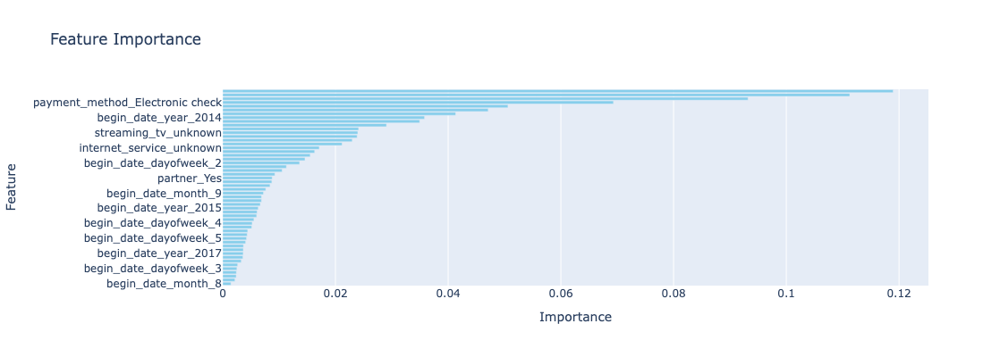

In [286]:
extra_trees_model(train_ohe, val_ohe, test_ohe, balanced='balanced', samp='up', target_field='churn')

churn
0    3095
1    3095
Name: count, dtype: int64
Confusion  matrixes  for  the  model  are  below,  first  by  percentage,  then  by  instances.


,Predicted False,Predicted True
Is False,0.759923,0.240077
Is True,0.248663,0.751337


,Predicted False,Predicted True
Is False,785,248
Is True,93,281


             train       val      test
Accuracy  0.837480  0.788913  0.757640
F1        0.846459  0.670366  0.622370
APS       0.908049  0.704872  0.642902
ROC AUC   0.919865  0.866323  0.834570


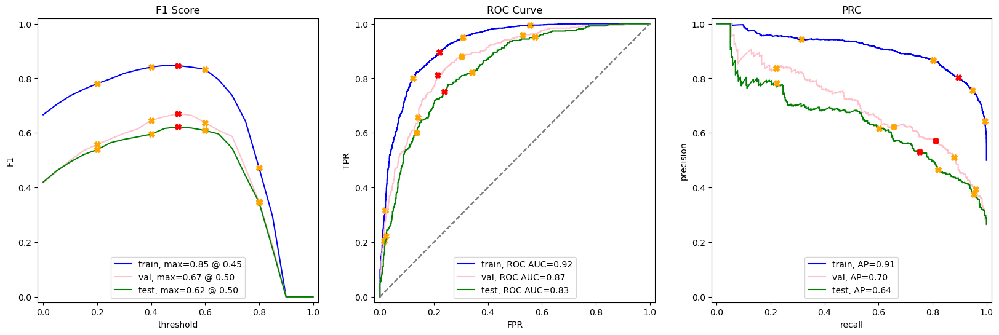

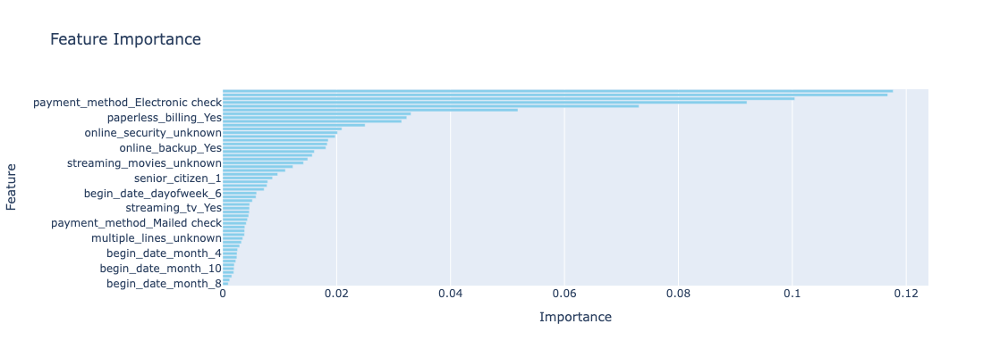

In [288]:
extra_trees_model(train_ohe, val_ohe, test_ohe, balanced='balanced', samp='smote', target_field='churn')

## Conclusions

In [290]:
eval_stats_all = eval_stats_all.drop_duplicates()
eval_stats_all.sort_values(by='test_roc_auc', ascending=False)

,model_name,full_model,test_accuracy,test_f1,test_roc_auc,test_aps
2,LGBMClassifier,"LGBMClassifier(boosting_type=gbdt, class_weigh...",0.886994,0.763744,0.918624,0.866840
3,XGBClassifier,"XGBClassifier(objective=binary:logistic, base_...",0.879176,0.747774,0.916587,0.863446
27,CatBoostClassifier,"CatBoostClassifier(iterations=500, learning_ra...",0.880597,0.748503,0.915919,0.858626
20,XGBClassifier,"XGBClassifier(objective=binary:logistic, base_...",0.878465,0.745914,0.915854,0.859868
19,XGBClassifier,"XGBClassifier(objective=binary:logistic, base_...",0.874200,0.750353,0.914185,0.852396
14,LGBMClassifier,"LGBMClassifier(boosting_type=gbdt, class_weigh...",0.874200,0.731411,0.910923,0.845098
26,CatBoostClassifier,"CatBoostClassifier(iterations=500, learning_ra...",0.866382,0.743869,0.905478,0.841760
13,LGBMClassifier,"LGBMClassifier(boosting_type=gbdt, class_weigh...",0.857854,0.730458,0.904238,0.838675
25,CatBoostClassifier,"CatBoostClassifier(iterations=500, learning_ra...",0.814499,0.697567,0.895253,0.810026
22,XGBClassifier,"XGBClassifier(objective=binary:logistic, base_...",0.848614,0.702929,0.892572,0.815446


Because of the way the dataframe is concatenated the index also represents the order in which these models were run and the order in which they appear in the 'Testing' section. The dataframe has been sorted to provide the models with the highest AUC-ROC score. I drop duplicates and resave the dataframe to ensure if any of the testing cells are run repeatedly, those results do not skew the above dataframe or any dependent code.

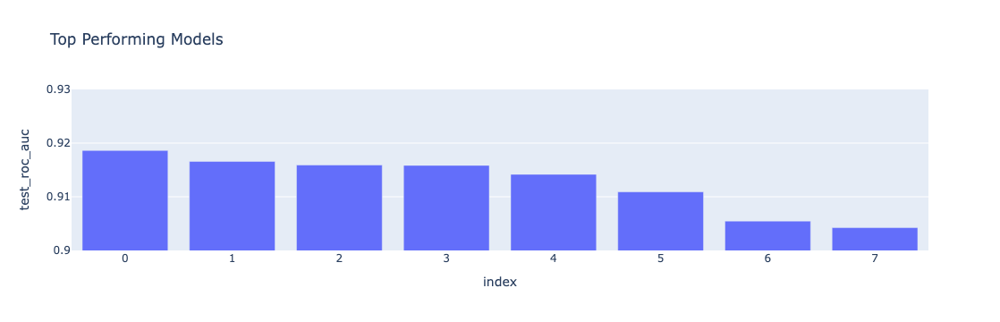

In [293]:
fig = px.bar(eval_stats_all.sort_values(by='test_roc_auc', ascending=False).reset_index(drop=True).head(8), hover_data={'model_name': True},
             y='test_roc_auc', title='Top Performing Models')
fig.update_layout(yaxis=dict(range=[0.9, .93]))
fig.show()

In [294]:
eval_stats_all.sort_values(by='test_roc_auc', ascending=False).reset_index(drop=True).head(8)

,model_name,full_model,test_accuracy,test_f1,test_roc_auc,test_aps
0,LGBMClassifier,"LGBMClassifier(boosting_type=gbdt, class_weigh...",0.886994,0.763744,0.918624,0.866840
1,XGBClassifier,"XGBClassifier(objective=binary:logistic, base_...",0.879176,0.747774,0.916587,0.863446
2,CatBoostClassifier,"CatBoostClassifier(iterations=500, learning_ra...",0.880597,0.748503,0.915919,0.858626
3,XGBClassifier,"XGBClassifier(objective=binary:logistic, base_...",0.878465,0.745914,0.915854,0.859868
4,XGBClassifier,"XGBClassifier(objective=binary:logistic, base_...",0.874200,0.750353,0.914185,0.852396
5,LGBMClassifier,"LGBMClassifier(boosting_type=gbdt, class_weigh...",0.874200,0.731411,0.910923,0.845098
6,CatBoostClassifier,"CatBoostClassifier(iterations=500, learning_ra...",0.866382,0.743869,0.905478,0.841760
7,LGBMClassifier,"LGBMClassifier(boosting_type=gbdt, class_weigh...",0.857854,0.730458,0.904238,0.838675


The above view of the dataframe is provided to add more context to the bar graph above. The below cells show which model performed best in the other metrics that were not the primary metric.

In [296]:
eval_stats_all.sort_values(by='test_accuracy', ascending=False).head(1)

,model_name,full_model,test_accuracy,test_f1,test_roc_auc,test_aps
2,LGBMClassifier,"LGBMClassifier(boosting_type=gbdt, class_weigh...",0.886994,0.763744,0.918624,0.86684


In [298]:
eval_stats_all.sort_values(by='test_f1', ascending=False).head(1)

,model_name,full_model,test_accuracy,test_f1,test_roc_auc,test_aps
2,LGBMClassifier,"LGBMClassifier(boosting_type=gbdt, class_weigh...",0.886994,0.763744,0.918624,0.86684


In [299]:
eval_stats_all.sort_values(by='test_aps', ascending=False).head(1)

,model_name,full_model,test_accuracy,test_f1,test_roc_auc,test_aps
2,LGBMClassifier,"LGBMClassifier(boosting_type=gbdt, class_weigh...",0.886994,0.763744,0.918624,0.86684


- The above eight models all have a ROC-AUC score of .91 or .92. They performed the best out of the 37 models recorded in the above dataframe. All models varied in their parameters, sampling methods, or used different encoding methods. Extra precision was added to the collected metrics since many models are so close in their differences. The trade-off is that it is not as clean a read as when it was only two decimal points.
- The best model was a LGBMClassifier paired with a GridSearchCV model to find the best parameters for the model. Other models portrayed above include CatboostClassifiers and XGBoostClassifiers.
- The LGBMClassifier at indice 0 in the graph and shortened dataframe also had the highest accuracy and APS on the test sets. A CatBoostClassifier has the highest test_f1 score.
- It is possible that pairing other gradient boosting algorithms with a grid search algorithm would produce better results than the LGBMClassifier paired with the GridSearchCV model, since gradient boosting worked the best with this kind of dataset.
- The best people to send promotional material to would be the 3.969% of people that the LGBMClassifier incorrectly predicted had already left Interconnect. The percentage was taken from the confusion matrix that was created with the top performing LGBMClassifier. The accuracy metric is a bit misleading since there is no benefit of calculating the people who have left the service but were predicted as still retaining it (false negatives), though accuracy would take that into account. Though if the business wanted to send promotional material to say the 10% of customers most likely to leave, other models would be more appropriate.
- The fields 'type' and 'total_charges' were found most useful in creating accurate models.